Processing BA46 - C - rep1
Processing BA46 - S - rep1


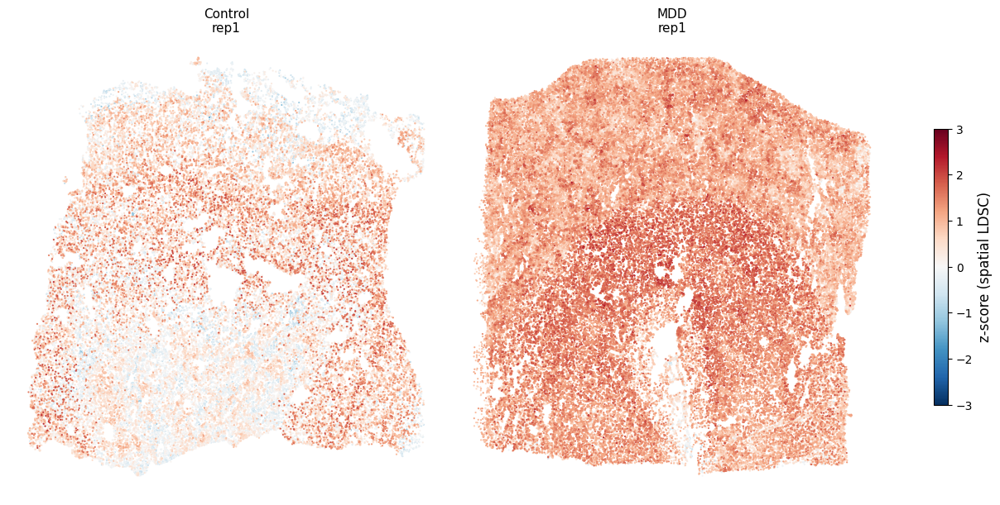

In [3]:
import os
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# =========================
# 参数
# =========================
BASE_DIR = "/biostack/home/suchenyi/graduate/gsmap/human_h5ad"
REGIONS    = ["BA12", "BA46"]
CONDITIONS = ["C", "S"]
REPS       = ["rep1", "rep2"]          # ← 新增
TRAITS     = ["MDD"]

MANUAL_OVERRIDES = {
    ("BA46", "C", "rep1"): 0,          # ← key 加入 rep 维度
    ("BA46", "C", "rep2"): 0,
}
REGION_ROTATIONS = {
    "BA46": 0,
    "BA12": 0,
}

# =========================
# 工具函数
# =========================
def load_ldsc_single(region, condition, rep, trait):
    """读取单个 rep 的 LDSC 结果（不再合并）。"""
    path = (f"{BASE_DIR}/{region}_{condition}_{rep}/spatial_ldsc/"
            f"{region}_{condition}_{rep}_{trait}.csv.gz")
    if not os.path.exists(path):
        return None
    df = pd.read_csv(path)
    df["spot"] = df["spot"].astype(str)
    return df[["spot", "z"]].rename(columns={"z": "z_mean"})


def rotate_coords(coords: np.ndarray, angle_deg: float) -> np.ndarray:
    theta = np.radians(angle_deg)
    c, s = np.cos(theta), np.sin(theta)
    R = np.array([[c, -s], [s, c]])
    centroid = coords.mean(axis=0)
    return (coords - centroid) @ R.T + centroid


def align_to_reference(coords, ref_coords, grid_size=60):
    def normalize(c):
        c = c.astype(float).copy()
        for d in range(2):
            lo, hi = c[:, d].min(), c[:, d].max()
            c[:, d] = (c[:, d] - lo) / max(hi - lo, 1e-9)
        return c

    def to_grid(c):
        g = np.zeros((grid_size, grid_size), dtype=np.float32)
        xi = np.clip((c[:, 0] * (grid_size - 1)).astype(int), 0, grid_size - 1)
        yi = np.clip((c[:, 1] * (grid_size - 1)).astype(int), 0, grid_size - 1)
        g[yi, xi] = 1.0
        return g

    def get_8_transforms(c):
        c = c.astype(float).copy()
        c[:, 0] -= c[:, 0].min()
        c[:, 1] -= c[:, 1].min()
        x, y = c[:, 0], c[:, 1]
        xm, ym = x.max(), y.max()
        return [
            np.c_[x,      y     ], np.c_[xm-x,  y     ],
            np.c_[x,      ym-y  ], np.c_[xm-x,  ym-y  ],
            np.c_[y,      x     ], np.c_[ym-y,  x     ],
            np.c_[y,      xm-x  ], np.c_[ym-y,  xm-x  ],
        ]

    ref_grid = to_grid(normalize(ref_coords))
    best_coords, best_score = coords, -np.inf
    for candidate in get_8_transforms(coords):
        score = float(np.sum(ref_grid * to_grid(normalize(candidate))))
        if score > best_score:
            best_score, best_coords = score, candidate
    return best_coords


# =========================
# 画图：2行 × 4列（C_rep1, C_rep2, S_rep1, S_rep2）
# =========================
COLS = [(cond, rep) for cond in CONDITIONS for rep in REPS]   # 4列
reference_coords = {}   # key: (region, rep)

fig, axes = plt.subplots(
    nrows=len(REGIONS),
    ncols=len(COLS),
    figsize=(22, 12),
    constrained_layout=True,
)

for i, region in enumerate(REGIONS):
    for j, (condition, rep) in enumerate(COLS):
        ax = axes[i, j]
        print(f"Processing {region} - {condition} - {rep}")

        h5ad_path = (f"{BASE_DIR}/{region}_{condition}_{rep}/"
                     f"{region}_{condition}_{rep}_annotated.h5ad")
        if not os.path.exists(h5ad_path):
            ax.axis("off")
            continue

        adata = sc.read_h5ad(h5ad_path)
        adata.obs.index = adata.obs.index.astype(str)

        # ---- 读取 trait z-score（单 rep）
        trait_series = []
        for trait in TRAITS:
            df_ldsc = load_ldsc_single(region, condition, rep, trait)
            if df_ldsc is None:
                continue
            trait_series.append(df_ldsc.set_index("spot")["z_mean"])

        if not trait_series:
            ax.axis("off")
            continue

        z_all = pd.concat(trait_series, axis=1)
        z_all["z"] = z_all.mean(axis=1)

        adata.obs["spot_clean"] = adata.obs.index.str.replace("-1", "", regex=False)
        adata.obs = adata.obs.merge(
            z_all[["z"]], left_on="spot_clean", right_index=True, how="left"
        )
        adata = adata[~adata.obs["z"].isna()].copy()

        # ---- 坐标流水线
        coords = adata.obs[["x", "y"]].values.astype(float)
        coords[:, 0] -= coords[:, 0].min()
        coords[:, 1] -= coords[:, 1].min()

        ref_key = (region, rep)
        if condition == "C":
            reference_coords[ref_key] = coords.copy()
        else:
            ref = reference_coords.get(ref_key)
            if ref is not None:
                coords = align_to_reference(coords, ref)

        override_angle = MANUAL_OVERRIDES.get((region, condition, rep))
        if override_angle is not None:
            coords = rotate_coords(coords, override_angle)

        final_angle = REGION_ROTATIONS.get(region, 0)
        if final_angle != 0:
            coords = rotate_coords(coords, final_angle)

        adata.obsm["X_spatial_temp"] = coords

        # ---- 绘制
        sc.pl.embedding(
            adata, basis="X_spatial_temp", color="z",
            color_map="RdBu_r", vmin=-8, vmax=8,
            size=10, ax=ax, show=False, colorbar_loc=None, title="",
        )
        for text in ax.texts:
            if text.get_text() == "z":
                text.remove()

        ax.set_xticks([]); ax.set_yticks([])
        ax.set_xlabel(""); ax.set_ylabel("")
        for spine in ax.spines.values():
            spine.set_visible(False)

        # 列标题：第0行显示 "Control rep1" 等
        if i == 0:
            label = ("Control" if condition == "C" else "Stress") + f"\n{rep}"
            ax.set_title(label, fontsize=11, pad=4)
        # 行标题：第0列显示脑区名
        if j == 0:
            ax.set_ylabel(region, fontsize=12, labelpad=4)

        ax.invert_yaxis()

# ---- 全局 colorbar
norm = mcolors.Normalize(vmin=-3, vmax=3)
sm = cm.ScalarMappable(cmap="RdBu_r", norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes, fraction=0.015, shrink=0.6, pad=0.02)
cbar.set_label("z-score (spatial LDSC)", fontsize=12)

os.makedirs("human_results", exist_ok=True)
plt.savefig("human_results/gsmap_spatial_by_rep1_BA46.png", dpi=300, bbox_inches="tight")
plt.show()

Processing BA12 - C - rep1
Processing BA12 - C - rep2
Processing BA12 - S - rep1
Processing BA12 - S - rep2
Processing BA46 - C - rep1
Processing BA46 - C - rep2
Processing BA46 - S - rep1
Processing BA46 - S - rep2


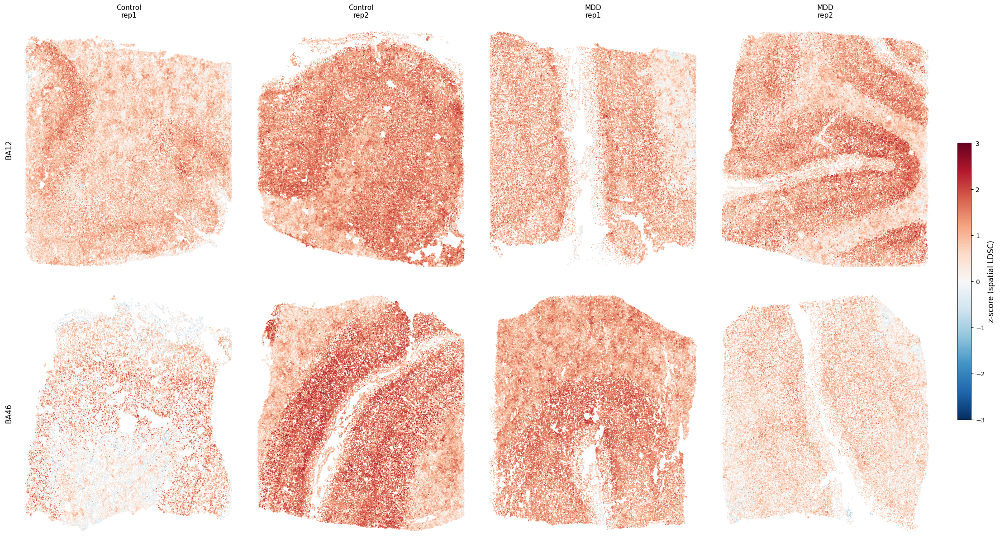

In [4]:
# =========================
# 画图：2行 × 4列（C_rep1, C_rep2, S_rep1, S_rep2）
# =========================
COLS = [(cond, rep) for cond in CONDITIONS for rep in REPS]   # 4列
reference_coords = {}   # key: (region, rep)

fig, axes = plt.subplots(
    nrows=len(REGIONS),
    ncols=len(COLS),
    figsize=(22, 12),
    constrained_layout=True,
)

for i, region in enumerate(REGIONS):
    for j, (condition, rep) in enumerate(COLS):
        ax = axes[i, j]
        print(f"Processing {region} - {condition} - {rep}")

        h5ad_path = (f"{BASE_DIR}/{region}_{condition}_{rep}/"
                     f"{region}_{condition}_{rep}_annotated.h5ad")
        if not os.path.exists(h5ad_path):
            ax.axis("off")
            continue

        adata = sc.read_h5ad(h5ad_path)
        adata.obs.index = adata.obs.index.astype(str)

        # ---- 读取 trait z-score（单 rep）
        trait_series = []
        for trait in TRAITS:
            df_ldsc = load_ldsc_single(region, condition, rep, trait)
            if df_ldsc is None:
                continue
            trait_series.append(df_ldsc.set_index("spot")["z_mean"])

        if not trait_series:
            ax.axis("off")
            continue

        z_all = pd.concat(trait_series, axis=1)
        z_all["z"] = z_all.mean(axis=1)

        adata.obs["spot_clean"] = adata.obs.index.str.replace("-1", "", regex=False)
        adata.obs = adata.obs.merge(
            z_all[["z"]], left_on="spot_clean", right_index=True, how="left"
        )
        adata = adata[~adata.obs["z"].isna()].copy()

        # ---- 坐标流水线
        coords = adata.obs[["x", "y"]].values.astype(float)
        coords[:, 0] -= coords[:, 0].min()
        coords[:, 1] -= coords[:, 1].min()

        ref_key = (region, rep)
        if condition == "C":
            reference_coords[ref_key] = coords.copy()
        else:
            ref = reference_coords.get(ref_key)
            if ref is not None:
                coords = align_to_reference(coords, ref)

        override_angle = MANUAL_OVERRIDES.get((region, condition, rep))
        if override_angle is not None:
            coords = rotate_coords(coords, override_angle)

        final_angle = REGION_ROTATIONS.get(region, 0)
        if final_angle != 0:
            coords = rotate_coords(coords, final_angle)

        adata.obsm["X_spatial_temp"] = coords

        # ---- 绘制
        sc.pl.embedding(
            adata, basis="X_spatial_temp", color="z",
            color_map="RdBu_r", vmin=-8, vmax=8,
            size=10, ax=ax, show=False, colorbar_loc=None, title="",
        )
        for text in ax.texts:
            if text.get_text() == "z":
                text.remove()

        ax.set_xticks([]); ax.set_yticks([])
        ax.set_xlabel(""); ax.set_ylabel("")
        for spine in ax.spines.values():
            spine.set_visible(False)

        # 列标题：第0行显示 "Control rep1" 等
        if i == 0:
            label = ("Control" if condition == "C" else "MDD") + f"\n{rep}"
            ax.set_title(label, fontsize=11, pad=4)
        # 行标题：第0列显示脑区名
        if j == 0:
            ax.set_ylabel(region, fontsize=12, labelpad=4)

        ax.invert_yaxis()

# ---- 全局 colorbar
norm = mcolors.Normalize(vmin=-3, vmax=3)
sm = cm.ScalarMappable(cmap="RdBu_r", norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes, fraction=0.015, shrink=0.6, pad=0.02)
cbar.set_label("z-score (spatial LDSC)", fontsize=12)

os.makedirs("human_results", exist_ok=True)
plt.savefig("human_results/gsmap_spatial_by_rep1_BA46.png", dpi=300, bbox_inches="tight")
plt.show()

共检测到 21 种细胞类型：['Astro AQP4 SLC1A2', 'Astro GFAP AQP1', 'InN ADARB2 FAM19A1', 'InN LAMP5 BMP7', 'InN PVALB HPSE', 'InN PVALB PDE3A', 'InN SST FREM1', 'InN VIP CLSTN2', 'L2-3 CUX2 ACVR1C THSD7A', 'L2-3 CUX2 NTNG1 PALMD', 'L3-5 RORB GABRG1 KCNH7', 'L3-5 RORB MKX DCC', 'L3-5 RORB MKX GRIN3A', 'L5-6 FEZF2 NXPH2 CDH8', 'L6 FEZF2 NPFFR2 TPD52L1', 'L6 OPRK1 SMYD1 KCND2', 'L6 OPRK1 THEMIS RGS6', 'Micro P2RY12 APBB1IP', 'OPC PDGFRA PCDH15', 'Oligo MOG OPALIN', 'PC P2RY14 GRM8']

[excitatory] (9): ['L2-3 CUX2 ACVR1C THSD7A', 'L2-3 CUX2 NTNG1 PALMD', 'L3-5 RORB GABRG1 KCNH7', 'L3-5 RORB MKX DCC', 'L3-5 RORB MKX GRIN3A', 'L5-6 FEZF2 NXPH2 CDH8', 'L6 FEZF2 NPFFR2 TPD52L1', 'L6 OPRK1 SMYD1 KCND2', 'L6 OPRK1 THEMIS RGS6']
[inhibitory] (6): ['InN PVALB HPSE', 'InN PVALB PDE3A', 'InN SST FREM1', 'InN VIP CLSTN2', 'InN LAMP5 BMP7', 'InN ADARB2 FAM19A1']
[glial] (6): ['Astro AQP4 SLC1A2', 'Astro GFAP AQP1', 'Oligo MOG OPALIN', 'OPC PDGFRA PCDH15', 'Micro P2RY12 APBB1IP', 'PC P2RY14 GRM8']
[unknown] (0): [

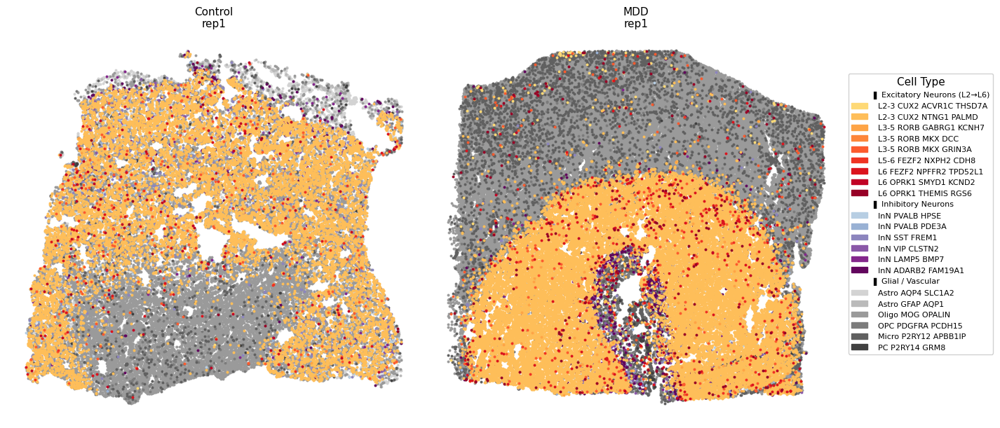

In [1]:
import os
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# =========================
# 参数
# =========================
BASE_DIR   = "/biostack/home/suchenyi/graduate/gsmap/human_h5ad"
REGIONS    = ["BA46"]  # 只保留BA46
CONDITIONS = ["C", "S"]
REPS       = ["rep1"]  # 只保留rep1

MANUAL_OVERRIDES = {
    ("BA46", "C", "rep1"): 0,
    ("BA46", "S", "rep1"): 0,  # 添加S条件
}
REGION_ROTATIONS = {"BA46": 0}
CELLTYPE_COL = "manual_cell_type_annotated"

# =========================
# 细胞类型分组（按生物学顺序排列，决定颜色梯度方向）
# =========================
EXCITATORY_ORDERED = [
    "L2-3 CUX2 ACVR1C THSD7A",
    "L2-3 CUX2 NTNG1 PALMD",
    "L2-4 CUX2 RORB CLMN",
    "L3-5 RORB GABRG1 KCNH7",
    "L3-5 RORB MKX DCC",
    "L3-5 RORB MKX GRIN3A",
    "L5-6 FEZF2 NXPH2 CDH8",
    "L6 FEZF2 NPFFR2 TPD52L1",
    "L6 OPRK1 SMYD1 KCND2",
    "L6 OPRK1 THEMIS RGS6",
]

INHIBITORY_ORDERED = [
    "InN PVALB HPSE",
    "InN PVALB PDE3A",
    "InN SST FREM1",
    "InN VIP CLSTN2",
    "InN LAMP5 BMP7",
    "InN ADARB2 FAM19A1",
]

GLIAL_ORDERED = [
    "Astro AQP4 SLC1A2",
    "Astro GFAP AQP1",
    "Oligo MOG OPALIN",
    "OPC PDGFRA PCDH15",
    "Micro P2RY12 APBB1IP",
    "PC P2RY14 GRM8",
]


MANUAL_GROUP: dict = {
    **{ct: "excitatory" for ct in EXCITATORY_ORDERED},
    **{ct: "inhibitory" for ct in INHIBITORY_ORDERED},
    **{ct: "glial"      for ct in GLIAL_ORDERED},
}

GROUP_META = {
    "excitatory": ("Excitatory Neurons (L2→L6)", EXCITATORY_ORDERED),
    "inhibitory": ("Inhibitory Neurons",          INHIBITORY_ORDERED),
    "glial":      ("Glial / Vascular",            GLIAL_ORDERED),
    "unknown":    ("Unclassified",                []),   # 运行时动态填充
}

# =========================
# 工具函数
# =========================
def rotate_coords(coords: np.ndarray, angle_deg: float) -> np.ndarray:
    theta = np.radians(angle_deg)
    c, s = np.cos(theta), np.sin(theta)
    R = np.array([[c, -s], [s, c]])
    centroid = coords.mean(axis=0)
    return (coords - centroid) @ R.T + centroid


def align_to_reference(coords: np.ndarray,
                        ref_coords: np.ndarray,
                        grid_size: int = 60) -> np.ndarray:
    def normalize(c):
        c = c.astype(float).copy()
        for d in range(2):
            lo, hi = c[:, d].min(), c[:, d].max()
            c[:, d] = (c[:, d] - lo) / max(hi - lo, 1e-9)
        return c

    def to_grid(c):
        g = np.zeros((grid_size, grid_size), dtype=np.float32)
        xi = np.clip((c[:, 0] * (grid_size - 1)).astype(int), 0, grid_size - 1)
        yi = np.clip((c[:, 1] * (grid_size - 1)).astype(int), 0, grid_size - 1)
        g[yi, xi] = 1.0
        return g

    def get_8_transforms(c):
        c = c.astype(float).copy()
        c[:, 0] -= c[:, 0].min()
        c[:, 1] -= c[:, 1].min()
        x, y = c[:, 0], c[:, 1]
        xm, ym = x.max(), y.max()
        return [
            np.c_[x,     y    ], np.c_[xm-x, y    ],
            np.c_[x,     ym-y ], np.c_[xm-x, ym-y ],
            np.c_[y,     x    ], np.c_[ym-y, x    ],
            np.c_[y,     xm-x ], np.c_[ym-y, xm-x ],
        ]

    ref_grid = to_grid(normalize(ref_coords))
    best_coords, best_score = coords, -np.inf
    for candidate in get_8_transforms(coords):
        score = float(np.sum(ref_grid * to_grid(normalize(candidate))))
        if score > best_score:
            best_score, best_coords = score, candidate
    return best_coords


def sample_colormap(cmap_name: str, n: int,
                    lo: float = 0.25, hi: float = 0.95) -> list:
    """从 colormap 中均匀采 n 个颜色。"""
    if n == 0:
        return []
    cmap = plt.get_cmap(cmap_name)
    return [cmap(v) for v in np.linspace(lo, hi, n)]


def build_semantic_palette(all_categories):
    """
    兴奋性 → YlOrRd（浅层浅色，深层深色）
    抑制性 → BuPu（PVALB浅蓝 → ADARB2深紫）
    胶质   → Greys（浅灰 → 深灰）
    未知   → YlGn（兜底）
    """
    # 动态填充 unknown
    unknown_cts = sorted(ct for ct in all_categories if ct not in MANUAL_GROUP)
    GROUP_META["unknown"] = ("Unclassified", unknown_cts)

    # 只保留实际存在于数据中的细胞类型（顺序不变）
    groups_present = {
        "excitatory": [ct for ct in EXCITATORY_ORDERED if ct in all_categories],
        "inhibitory": [ct for ct in INHIBITORY_ORDERED if ct in all_categories],
        "glial":      [ct for ct in GLIAL_ORDERED      if ct in all_categories],
        "unknown":    unknown_cts,
    }

    for g, cts in groups_present.items():
        print(f"[{g}] ({len(cts)}): {cts}")

    palette = {}

    exc_cols = sample_colormap("YlOrRd", len(groups_present["excitatory"]),
                               lo=0.25, hi=0.95)
    for ct, col in zip(groups_present["excitatory"], exc_cols):
        palette[ct] = col

    inh_cols = sample_colormap("BuPu", len(groups_present["inhibitory"]),
                               lo=0.28, hi=0.95)
    for ct, col in zip(groups_present["inhibitory"], inh_cols):
        palette[ct] = col

    gli_cols = sample_colormap("Greys", len(groups_present["glial"]),
                               lo=0.28, hi=0.80)
    for ct, col in zip(groups_present["glial"], gli_cols):
        palette[ct] = col

    unk_cols = sample_colormap("YlGn", len(groups_present["unknown"]),
                               lo=0.35, hi=0.85)
    for ct, col in zip(groups_present["unknown"], unk_cols):
        palette[ct] = col

    return palette, groups_present


def make_legend_handles(groups_present: dict, palette: dict) -> list:
    """分组图例：每组前置标题行，细类型缩进。"""
    group_display_order = ["excitatory", "inhibitory", "glial", "unknown"]
    handles = []
    for gk in group_display_order:
        cts = groups_present.get(gk, [])
        if not cts:
            continue
        title_label, _ = GROUP_META[gk]
        # 组标题用空白patch模拟分隔
        handles.append(mpatches.Patch(color="none", label=f"▌ {title_label}"))
        for ct in cts:
            handles.append(mpatches.Patch(color=palette[ct], label=f"  {ct}"))
    return handles


# =========================
# 第一遍：收集全部细胞类型
# =========================
COLS = [(cond, rep) for cond in CONDITIONS for rep in REPS]
all_categories: set = set()

for region in REGIONS:
    for condition, rep in COLS:
        h5ad_path = (f"{BASE_DIR}/{region}_{condition}_{rep}/"
                     f"{region}_{condition}_{rep}_annotated.h5ad")
        if not os.path.exists(h5ad_path):
            continue
        adata_tmp = sc.read_h5ad(h5ad_path)
        if CELLTYPE_COL not in adata_tmp.obs.columns:
            candidates = [c for c in adata_tmp.obs.columns
                          if any(k in c.lower() for k in
                                 ["cell","type","cluster","leiden",
                                  "louvain","annot","label"])]
            if candidates:
                adata_tmp.obs[CELLTYPE_COL] = adata_tmp.obs[candidates[0]]
            else:
                continue
        all_categories.update(adata_tmp.obs[CELLTYPE_COL].dropna().unique())

print(f"共检测到 {len(all_categories)} 种细胞类型：{sorted(all_categories)}\n")
palette, groups_present = build_semantic_palette(all_categories)

# 绘制顺序：胶质垫底，抑制中间，兴奋最上层
DRAW_ORDER = ["unknown", "glial", "inhibitory", "excitatory"]

# =========================
# 画图：1行 × 2列（因为只有BA46的C和S）
# =========================
reference_coords: dict = {}

fig, axes = plt.subplots(
    nrows=1,  # 只有一行
    ncols=len(COLS),  # 2列：C和S
    figsize=(12, 6),  # 调整图片大小
    constrained_layout=True,
)

for i, region in enumerate(REGIONS):
    for j, (condition, rep) in enumerate(COLS):
        ax = axes[j]  # 因为只有一行，所以直接用索引访问
        print(f"Processing {region} - {condition} - {rep}")

        h5ad_path = (f"{BASE_DIR}/{region}_{condition}_{rep}/"
                     f"{region}_{condition}_{rep}_annotated.h5ad")
        if not os.path.exists(h5ad_path):
            ax.axis("off")
            continue

        adata = sc.read_h5ad(h5ad_path)
        adata.obs.index = adata.obs.index.astype(str)

        if CELLTYPE_COL not in adata.obs.columns:
            candidates = [c for c in adata.obs.columns
                          if any(k in c.lower() for k in
                                 ["cell","type","cluster","leiden",
                                  "louvain","annot","label"])]
            if candidates:
                adata.obs[CELLTYPE_COL] = adata.obs[candidates[0]]
            else:
                ax.axis("off"); continue

        adata = adata[~adata.obs[CELLTYPE_COL].isna()].copy()

        # ---- 坐标流水线
        coords = adata.obs[["x", "y"]].values.astype(float)
        coords[:, 0] -= coords[:, 0].min()
        coords[:, 1] -= coords[:, 1].min()

        ref_key = (region, rep)
        if condition == "C":
            reference_coords[ref_key] = coords.copy()
        else:
            ref = reference_coords.get(ref_key)
            if ref is not None:
                coords = align_to_reference(coords, ref)

        override_angle = MANUAL_OVERRIDES.get((region, condition, rep))
        if override_angle is not None:
            coords = rotate_coords(coords, override_angle)
        final_angle = REGION_ROTATIONS.get(region, 0)
        if final_angle != 0:
            coords = rotate_coords(coords, final_angle)

        # ---- 按组顺序绘制散点（胶质→抑制→兴奋）
        cell_types = adata.obs[CELLTYPE_COL].values
        for gk in DRAW_ORDER:
            for ct in groups_present.get(gk, []):
                mask = cell_types == ct
                if mask.sum() == 0:
                    continue
                ax.scatter(
                    coords[mask, 0], coords[mask, 1],
                    c=[palette[ct]], s=8, linewidths=0,
                    rasterized=True,
                    zorder=DRAW_ORDER.index(gk),
                )

        ax.invert_yaxis()
        ax.set_xticks([]); ax.set_yticks([])
        ax.set_xlabel(""); ax.set_ylabel("")
        for spine in ax.spines.values():
            spine.set_visible(False)

        # 设置标题和标签
        label = ("Control" if condition == "C" else "MDD") + f"\n{rep}"
        ax.set_title(label, fontsize=11, pad=6)
        
        # 因为只有BA46，所以不需要ylabel显示region名称

# =========================
# 分组图例（图右侧）
# =========================
legend_handles = make_legend_handles(groups_present, palette)
fig.legend(
    handles=legend_handles,
    title="Cell Type",
    title_fontsize=11,
    fontsize=8,
    loc="center right",
    bbox_to_anchor=(1.18, 0.5),
    frameon=True,
    framealpha=0.9,
    edgecolor="#cccccc",
)

os.makedirs("human_results", exist_ok=True)
plt.savefig(
    "human_results/gsmap_celltype_spatial_BA46_rep1.png",
    dpi=300,
    bbox_inches="tight",
)
print("图像已保存至 human_results/gsmap_celltype_spatial_BA46_rep1.png")
plt.show()

Processing BA12 - C


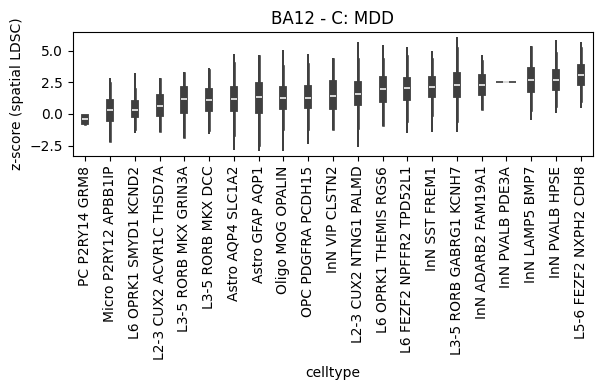

Processing BA12 - S


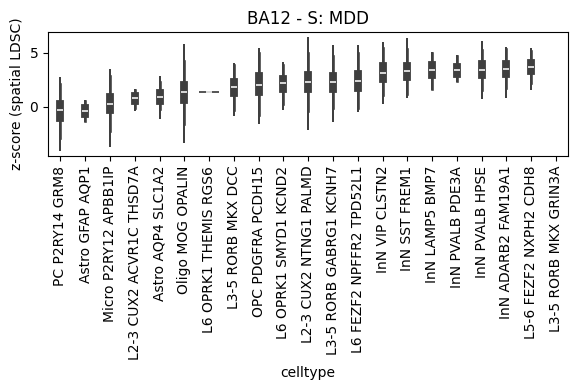

In [15]:
import os
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ranksums

def load_ldsc(region, condition, trait):
    dfs = []
    for rep in ["rep1", "rep2"]:
        file_path = f"/biostack/home/suchenyi/graduate/gsmap/human_h5ad/{region}_{condition}_{rep}/spatial_ldsc/{region}_{condition}_{rep}_{trait}.csv.gz"
        if not os.path.exists(file_path):
            continue

        df = pd.read_csv(file_path)
        df["spot"] = df["spot"].astype(str)
        df = df[["spot", "z"]].rename(columns={"z": f"z_{rep}"})
        dfs.append(df)

    if len(dfs) == 0:
        return None

    df_merge = dfs[0]
    for df in dfs[1:]:
        df_merge = df_merge.merge(df, on="spot", how="outer")

    z_cols = [c for c in df_merge.columns if "z_" in c]
    df_merge["z"] = df_merge[z_cols].mean(axis=1)

    return df_merge[["spot", "z"]]

def analyze_celltype_z(region, condition, trait="MDD"):

    print(f"Processing {region} - {condition}")

    h5ad_path = f"/biostack/home/suchenyi/graduate/gsmap/human_h5ad/{region}_{condition}_rep1/{region}_{condition}_rep1_annotated.h5ad"
    if not os.path.exists(h5ad_path):
        return None

    adata = sc.read_h5ad(h5ad_path)
    adata.obs.index = adata.obs.index.astype(str)
    adata.obs["spot_clean"] = adata.obs.index.str.replace("-1", "", regex=False)

    df_ldsc = load_ldsc(region, condition, trait)
    if df_ldsc is None:
        return None

    df = adata.obs.merge(
        df_ldsc,
        left_on="spot_clean",
        right_on="spot",
        how="inner"
    )

    if df.empty:
        return None

    # ===== 提取细胞类型
    df["celltype"] = df["manual_cell_type_reannotated"]

    return df[["celltype", "z"]]

REGION = "BA12"
TRAIT = "MDD"
CONDITIONS = ["C", "S"]

for condition in CONDITIONS:

    df = analyze_celltype_z(REGION, condition, TRAIT)
    if df is None:
        continue


    mask = df["celltype"].str.contains("Sst|Pvalb|Vip", case=False, na=False)
    df_sub = df.copy()
    #df_sub = df[mask].copy()
        #只保留 GABA interneuron

    if df_sub.empty:
        continue

    # ===== 画图
    plt.figure(figsize=(6,4))
    order = df.groupby("celltype")["z"].mean().sort_values().index


    sns.violinplot(
        data=df_sub,
        x="celltype",
        y="z",
        inner="box",
        cut=0,
        order=order
    )

    plt.title(f"{REGION} - {condition}: {TRAIT}")
    plt.xticks(rotation=90)
    plt.ylabel("z-score (spatial LDSC)")
    plt.tight_layout()

    plt.savefig(f"human_results/{REGION}_{condition}_violin.png", dpi=300)
    plt.show()

    # ===== 统计检验（SST vs others）
    if "Sst" in "".join(df_sub["celltype"].unique()):

        sst = df_sub[df_sub["celltype"].str.contains("Sst")]["z"]
        others = df_sub[~df_sub["celltype"].str.contains("Sst")]["z"]

        stat, p = ranksums(sst, others)

        print(f"{condition} | SST vs Others: p = {p:.3e}")

共读取 90 个 traits
   cell_type        trait    zscore
0       L2-4    E-Smoking  6.685426
1       L2-4  Neuroticism  5.995360
2       L3-5  Depression3  5.864490
3       L3-5         SePa  5.833287
4       L2-4  Depression3  5.496411
5         L5    E-Smoking  5.450047
6       L3-5   Depression  5.285292
7       L3-5    E-Smoking  5.003560
8       L2-4   Depression  4.798840
9       L2-4         SePa  4.629910
10      L3-5  Neuroticism  4.593391
11      L2-3         SePa  4.444591
12       InN          MDD  4.430900
13      L3-5  Depression2  4.182694
14      L5-6         CoPe  3.538778
15       OPC          MDD  3.476602
16      L3-5         CoPe  3.470409
17      L2-4  Depression2  3.450908
18       InN  Neuroticism  3.364307
19      L3-5           IQ  3.326058
20        L5  Depression3  3.154486
21        L6           IQ  3.121632
22      L2-4           IQ  2.958244
23      L2-4          MDD  2.939869
24        L6         CoPe  2.890023
25      L5-6   Depression  2.888233
26      L2-4

/biostack/home/suchenyi/.conda/envs/scdrs_env/lib/python3.8/site-packages/pycirclize/sector.py:162: UserWarning: r_lim=(100, 114) is unexpected plot range (0 <= r <= 100).
  warnings.warn(warn_msg, stacklevel=1)
/tmp/ipykernel_106741/4012502745.py:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig("MDD_chord_v3.pdf", dpi=300, bbox_inches="tight")
/tmp/ipykernel_106741/4012502745.py:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig("MDD_chord_v3.pdf", dpi=300, bbox_inches="tight")
/tmp/ipykernel_106741/4012502745.py:385: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig("MDD_chord_v3.png", dpi=300, bbox_inches="tight")
/biostack/home/suchenyi/.conda/envs/scdrs_env/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure inc

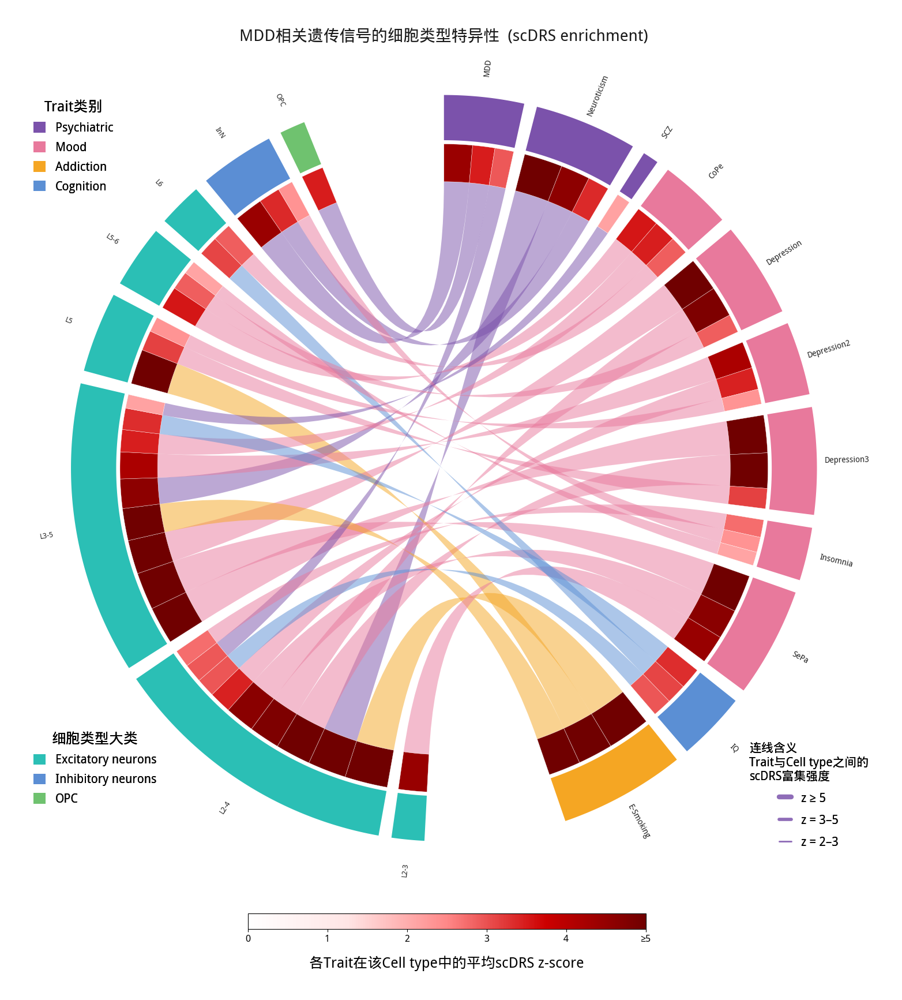

✓ Saved: MDD_chord_v3.pdf / .png


In [13]:
# ============================================================
# Chord diagram v3 — Reference aesthetic
# Two-layer sectors: heatmap inner band + color outer band
# Ribbons aligned with heatmap blocks via pre-computed offsets
# ============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.cm import ScalarMappable
from matplotlib.lines import Line2D
from pycirclize import Circos
import os

# ── Chinese font (adjust path for your HPC environment) ──────
plt.rcParams["font.sans-serif"] = [
    "WenQuanYi Micro Hei", "WenQuanYi Zen Hei",
    "Noto Sans CJK SC", "SimHei", "DejaVu Sans"
]
plt.rcParams["axes.unicode_minus"] = False

# ============================================
# 1. 读取数据
# ============================================

data_dir = "/biostack/home/suchenyi/graduate/scdrs/downstream_hg38"

traits = [
    f.replace(".scdrs_group.dominant_labels_short", "")
    for f in os.listdir(data_dir)
    if f.endswith(".scdrs_group.dominant_labels_short")
]
traits = sorted(traits)
print(f"共读取 {len(traits)} 个 traits")

gc_file = "/biostack/home/suchenyi/graduate/scdrs/lambda_GC_all.tsv"

df_gc = pd.read_csv(gc_file, sep="\t")
df_gc["Trait"] = df_gc["Trait"].astype(str)
df_gc = df_gc.set_index("Trait")

# 过滤 λGC <= 3
valid_traits = df_gc[df_gc["Lambda_GC"] <= 2].index.tolist()

# 与已有 traits 取交集
traits_filtered = [t for t in traits if t in valid_traits]

dict_df_stats = {
    trait: pd.read_csv(
        os.path.join(data_dir, f"{trait}.scdrs_group.dominant_labels_short"),
        sep="\t", index_col=0
    )
    for trait in traits_filtered
}

samples = list(dict_df_stats[traits_filtered[0]].index)

assoc_matrix = np.array([
    dict_df_stats[trait].loc[samples, "assoc_mcz"].values
    for trait in traits_filtered
]).T

df_assoc = pd.DataFrame(assoc_matrix, index=samples, columns=traits_filtered)

# ============================================
# 2. 宽矩阵 → 长格式，统一列名
# ============================================

df = (
    df_assoc
    .reset_index()
    .rename(columns={"index": "cell_type"})   # 行索引 → cell_type 列
    .melt(id_vars="cell_type", var_name="trait", value_name="zscore")
)

# ============================================
# 3. 过滤：指定 traits + zscore >= 2 + 每 trait top3
# ============================================

KEEP_TRAITS = [
    "SCZ", "MDD", "Neuroticism", "E-Smoking",
    "IQ", "CoPe", "Depression", "Depression2",
    "Depression3", "SePa", "Insomnia"
]

df = df[df["trait"].isin(KEEP_TRAITS)]          # ← 只保留指定 traits
df = df[df["zscore"] >= 2]
df = (
    df.sort_values("zscore", ascending=False)
      .groupby("trait")
      .head(3)
      .reset_index(drop=True)
)

print(df)
print(f"\n保留 traits：{sorted(df['trait'].unique())}")
print(f"涉及 cell types：{sorted(df['cell_type'].unique())}")


# ============================================================
# 2. COLOR SYSTEM
# ============================================================

trait_category = {
    "SCZ":         "Psychiatric",
    "MDD":         "Psychiatric",
    "Neuroticism": "Psychiatric",
    "E-Smoking":   "Addiction",
    "IQ":          "Cognition",
    "CoPe":        "Mood",
    "Depression":  "Mood",
    "Depression2": "Mood",
    "Depression3": "Mood",
    "SePa":        "Mood",
    "Insomnia":    "Mood",
}

TRAIT_CAT_COLORS = {
    "Psychiatric": "#7B52AB",   # purple
    "Mood":        "#E8799C",   # pink
    "Addiction":   "#F5A623",   # orange
    "Cognition":   "#5B8FD4",   # blue
    "Other":       "#AAAAAA",
}

CELLTYPE_CLASS_MAP = {
    "L2-3": "Excitatory", "L2-4": "Excitatory", "L3-5": "Excitatory",
    "L5":   "Excitatory", "L5-6": "Excitatory", "L6":   "Excitatory",
    "InN":  "Inhibitory",
    "Astro":"Astrocyte",
    "Micro":"Microglia",
    "Oligo":"Oligodendrocyte",
    "OPC":  "OPC",
    "PC":   "Pericyte",
}

CELLTYPE_CLASS_COLORS = {
    "Excitatory":      "#2BBFB5",   # teal
    "Inhibitory":      "#5B8ED4",   # blue
    "Astrocyte":       "#EAB825",   # gold
    "Microglia":       "#EAB825",   # gold (same group = glial)
    "Oligodendrocyte": "#6FC26F",   # green
    "OPC":             "#6FC26F",   # green
    "Pericyte":        "#9B7FCC",   # lavender
    "Other":           "#CCCCCC",
}

# White → dark-red heatmap (matches reference colorbar)
HMAP_CMAP = LinearSegmentedColormap.from_list(
    "wr",
    ["#FFFFFF", "#FFE5E5", "#FF8888", "#CC0000", "#700000"],
    N=256,
)
HMAP_NORM = mpl.colors.Normalize(vmin=0, vmax=5)

def tc(t):        # trait → category color
    return TRAIT_CAT_COLORS.get(trait_category.get(t, "Other"), "#AAAAAA")

def cc(ct):       # cell type → class color
    return CELLTYPE_CLASS_COLORS.get(CELLTYPE_CLASS_MAP.get(ct, "Other"), "#CCCCCC")

def zc(z):        # zscore → heatmap rgba
    return HMAP_CMAP(HMAP_NORM(z))

# ============================================================
# 3. NODE ORDERING  (group by category for clean arcs)
# ============================================================

CAT_ORDER   = ["Psychiatric", "Mood", "Cognition", "Addiction", "Other"]
CLASS_ORDER = ["Excitatory", "Inhibitory", "Astrocyte", "Microglia",
               "Oligodendrocyte", "OPC", "Pericyte", "Other"]

traits_list = sorted(
    df["trait"].unique(),
    key=lambda t: (CAT_ORDER.index(trait_category.get(t, "Other")), t),
)
celltypes_list = sorted(
    df["cell_type"].unique(),
    key=lambda c: (
        CLASS_ORDER.index(CELLTYPE_CLASS_MAP.get(c, "Other"))
        if CELLTYPE_CLASS_MAP.get(c, "Other") in CLASS_ORDER else 99,
        c,
    ),
)

ordered_nodes = traits_list + celltypes_list

node_size = {
    **{t: df[df["trait"]     == t]["zscore"].sum() for t in traits_list},
    **{c: df[df["cell_type"] == c]["zscore"].sum() for c in celltypes_list},
}

# Large gap between the two groups, small gap within
spaces = [
    22 if n in (traits_list[-1], celltypes_list[-1]) else 2.0
    for n in ordered_nodes
]

# ============================================================
# 4. PRE-COMPUTE RIBBON POSITIONS
#    (heatmap blocks must align perfectly with ribbon bases)
# ============================================================

offsets = {n: 0.0 for n in ordered_nodes}
ribbons = []

# Process descending by zscore → thick ribbons at bottom layer
for _, row in df.sort_values("zscore", ascending=False).iterrows():
    t, c, z = row["trait"], row["cell_type"], row["zscore"]
    t0 = offsets[t];  offsets[t] += z
    c0 = offsets[c];  offsets[c] += z
    ribbons.append({"t": t, "c": c, "z": z,
                    "t0": t0, "t1": offsets[t],
                    "c0": c0, "c1": offsets[c]})

# Per-sector slice lookup for heatmap
sector_slices = {n: [] for n in ordered_nodes}
for r in ribbons:
    sector_slices[r["t"]].append((r["t0"], r["t1"], r["z"]))
    sector_slices[r["c"]].append((r["c0"], r["c1"], r["z"]))

# ============================================================
# 5. BUILD CIRCOS
# ============================================================
#
#  Radii layout (inner → outer):
#   76 – 86 : heatmap band        (white→red blocks per connection)
#   87 – 99 : main color band     (solid category/class color)
#  100 – 114: label zone          (transparent, text only)
#
#  Ribbons attach at r = 76 (inner edge of heatmap band)

circos = Circos({n: node_size[n] for n in ordered_nodes}, space=spaces)

for sector in circos.sectors:
    name     = sector.name
    is_trait = name in traits_list
    main_col = tc(name) if is_trait else cc(name)

    # ── Heatmap band ─────────────────────────────────────────
    ht = sector.add_track((76, 86))
    ht.axis(fc="#F0F0F0", ec="none", lw=0)
    for x0, x1, z in sector_slices[name]:
        ht.rect(x0, x1, fc=zc(z), ec="white", lw=0.3)

    # ── Main color band ───────────────────────────────────────
    mt = sector.add_track((87, 99))
    mt.axis(fc=main_col, ec="none", lw=0)

    # ── Label track (transparent) ─────────────────────────────
    lt = sector.add_track((100, 114))
    lt.axis(fc="none", ec="none", lw=0)
    lt.text(
        name,
        size            = 10 if is_trait else 9,
        color           = "#222222",
        orientation     = "vertical",
        adjust_rotation = True,
        fontweight      = "bold" if is_trait else "normal",
    )

# ============================================================
# 6. RIBBONS
# ============================================================

zmax = df["zscore"].max()

for r in ribbons:
    alpha = 0.18 + 0.42 * (r["z"] / zmax)   # thin=pale, thick=vivid
    rgba  = mpl.colors.to_rgba(tc(r["t"]), alpha)
    circos.link(
        (r["t"], r["t0"], r["t1"]),
        (r["c"], r["c0"], r["c1"]),
        color=rgba, ec="none", lw=0,
        r1=76, r2=76,                         # meet sector at heatmap inner edge
    )

# ============================================================
# 7. FIGURE + LEGENDS  (replace the entire legend section)
# ============================================================

fig = circos.plotfig(figsize=(15, 15))
ax  = fig.axes[0]

ax.set_title(
    "MDD相关遗传信号的细胞类型特异性  (scDRS enrichment)",
    fontsize=20, fontweight="bold", pad=20, color="#1a1a1a",
)

# ── Legend A: Trait categories ────────────────────────────────
present_cats = {trait_category.get(t, "Other") for t in traits_list}
trait_leg = [
    mpatches.Patch(facecolor=c, label=cat, linewidth=0)
    for cat, c in TRAIT_CAT_COLORS.items()
    if cat in present_cats and cat != "Other"
]
leg_trait = fig.legend(
    handles=trait_leg,
    loc="upper left",
    bbox_to_anchor=(0.01, 0.92),     # figure-level 坐标
    bbox_transform=fig.transFigure,
    frameon=False, fontsize=15,
    title="Trait类别", title_fontsize=18,
    labelspacing=0.6,
)
fig.add_artist(leg_trait)

# ── Legend B: Cell type classes ── 修改后 ──
present_cls = {CELLTYPE_CLASS_MAP.get(c, "Other") for c in celltypes_list}

# 定义所有可能的类别及其中文标签
cls_labels = {
    "Excitatory":      "Excitatory neurons",
    "Inhibitory":      "Inhibitory neurons", 
    "Astrocyte":       "Glial cells",
    "Microglia":       "Microglia",
    "Oligodendrocyte": "Oligodendrocyte lineage",
    "OPC":             "OPC",
    "Pericyte":        "Pericyte",
    "Other":           "Other cell types",
}

# 动态构建 legend
cell_leg = [
    mpatches.Patch(facecolor=CELLTYPE_CLASS_COLORS.get(cls, "#CCCCCC"), 
                   label=cls_labels.get(cls, cls), linewidth=0)
    for cls in CLASS_ORDER  # 使用预定义的顺序
    if cls in present_cls and cls != "Other"
]

leg_cell = fig.legend(
    handles=cell_leg,
    loc="lower left",
    bbox_to_anchor=(0.01, 0.08),
    bbox_transform=fig.transFigure,
    frameon=False, fontsize=15,
    title="细胞类型大类", title_fontsize=18,
    labelspacing=0.6,
)
fig.add_artist(leg_cell)

# ── Legend C: Ribbon width key ────────────────────────────────
ribbon_leg = [
    Line2D([0], [0], color="#7B52AB", linewidth=w, alpha=0.6,
           label=label, solid_capstyle="round")
    for w, label in [(6, "z ≥ 5"), (4, "z = 3–5"), (2, "z = 2–3")]
]
leg_ribbon = fig.legend(
    handles=ribbon_leg,
    loc="lower right",
    bbox_to_anchor=(1, 0.03),
    bbox_transform=fig.transFigure,
    frameon=False, fontsize=15,
    title="连线含义\nTrait与Cell type之间的\nscDRS富集强度",
    title_fontsize=15,
    labelspacing=0.8,
)
fig.add_artist(leg_ribbon)

# ── Colorbar ──────────────────────────────────────────────────
cbar_ax = fig.add_axes([0.27, -0.05, 0.46, 0.018])
sm = ScalarMappable(cmap=HMAP_CMAP, norm=HMAP_NORM)
sm.set_array([])
cb = fig.colorbar(sm, cax=cbar_ax, orientation="horizontal")
cb.set_label(
    "各Trait在该Cell type中的平均scDRS z-score",
    fontsize=18, labelpad=15,
)
cb.set_ticks([0, 1, 2, 3, 4, 5])
cb.set_ticklabels(["0", "1", "2", "3", "4", "≥5"])
cb.ax.tick_params(labelsize=12)

# ── Group labels ──────────────────────────────────────────────
#fig.text(0.30, 0.95, "细胞类型",  fontsize=11,color="#7B52AB", fontweight="bold", ha="center",transform=fig.transFigure)
#fig.text(0.70, 0.95, "MDD相关Trait", fontsize=11,color="#2BBFB5", fontweight="bold", ha="center",transform=fig.transFigure)

# ============================================================
# 8. SAVE
# ============================================================

plt.savefig("MDD_chord_v3.pdf", dpi=300, bbox_inches="tight")
plt.savefig("MDD_chord_v3.png", dpi=300, bbox_inches="tight")
plt.show()
print("✓ Saved: MDD_chord_v3.pdf / .png")

All traits: 90
After λGC filter: 85
Psychiatric: 22
Metabolic: 22
  trait cell_type    zscore
0   MDD     Astro -0.548172
1   MDD       InN  4.430900
2   MDD      L2-3  1.618112
3   MDD      L2-4  2.939869
4   MDD      L3-5  1.893995

Top3 per trait:
          trait  cell_class    zscore
0     T-Protein   Microglia  9.327311
1       Albumin   Microglia  6.300925
2       Calcium    Pericyte  6.014406
3       Albumin    Pericyte  5.965031
4           GGT    Pericyte  5.870578
5           MPV    Pericyte  5.405745
6     T-Protein    Pericyte  5.215360
7           MPV   Microglia  5.169424
8   T-Bilirubin   Microglia  4.757433
9           ALT    Pericyte  4.530047
10    E-Smoking  Excitatory  4.492803
11          HCT    Pericyte  4.491015
12    E-Smoking  Inhibitory  4.485039
13        HbA1c   Microglia  4.472931
14          MDD  Inhibitory  4.430900
15          ALT   Microglia  4.411765
16      Calcium   Microglia  4.391966
17          ALP    Pericyte  4.358272
18         SePa  Excitatory

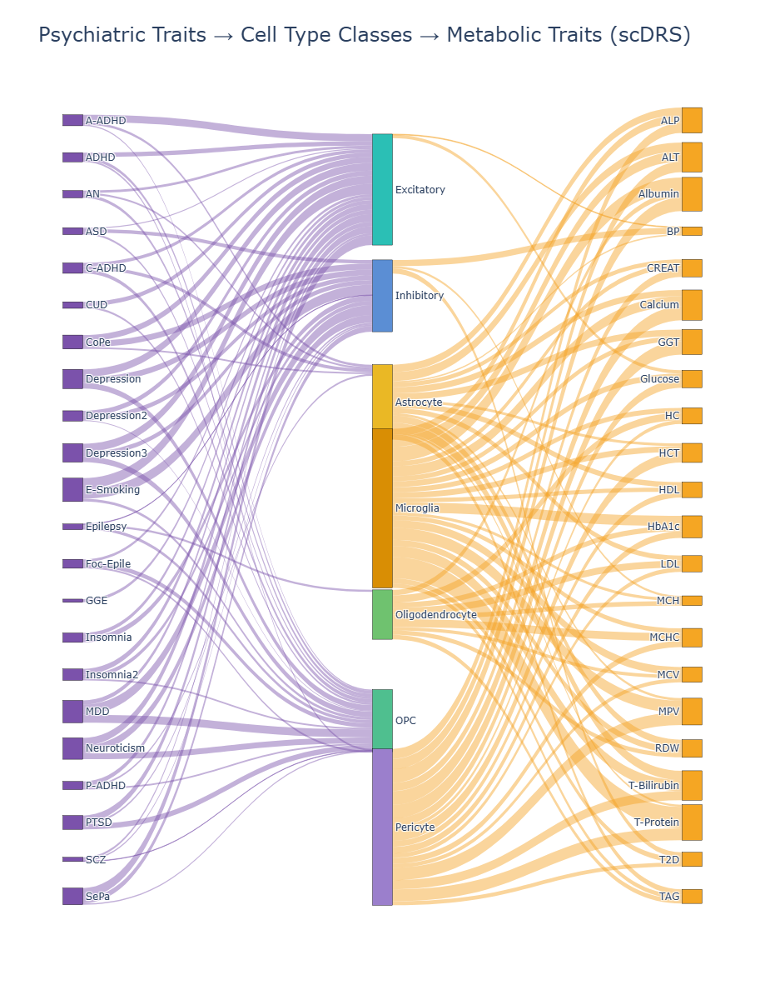

✓ Saved.


In [18]:
import os
import re
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# ==========================================================
# 1. PATHS
# ==========================================================

data_dir = "/biostack/home/suchenyi/graduate/scdrs/downstream_hg38"

gc_file = "/biostack/home/suchenyi/graduate/scdrs/lambda_GC_all.tsv"

# ==========================================================
# 2. TRAIT LIST
# ==========================================================

traits = [

    f.replace(".scdrs_group.dominant_labels_short","")

    for f in os.listdir(data_dir)

    if f.endswith(".scdrs_group.dominant_labels_short")
]

print("All traits:",len(traits))

# ==========================================================
# 3. λGC FILTER
# ==========================================================

df_gc = pd.read_csv(gc_file,sep="\t")

df_gc["Trait"] = df_gc["Trait"].astype(str)

valid_traits = df_gc.loc[
    df_gc["Lambda_GC"]<=2,
    "Trait"
].tolist()

traits = [t for t in traits if t in valid_traits]

print("After λGC filter:",len(traits))

# ==========================================================
# 4. TRAIT CATEGORY
# ==========================================================

PSYCHIATRIC_TRAITS = [

"SCZ","mdd","MDD","Depression","Depression2","Depression3",

"ADHD","A-ADHD","C-ADHD","P-ADHD",

"ASD","Neuroticism","PTSD",

"Insomnia","Insomnia2",

"Epilepsy","Foc-Epile","GGE",

"AN","CUD","E-Smoking",

"CoPe","SePa"

]

METABOLIC_TRAITS = [

"BMI","BMI2",

"T2D",

"Glucose",

"HbA1c",

"HDL",

"LDL",

"TAG",

"BP",

"Albumin",

"CREAT",

"ALP",

"ALT",

"GGT",

"Calcium",

"HC",

"MCH",

"MCHC",

"MCV",

"MPV",

"RDW",

"HCT",

"T-Bilirubin",

"T-Protein"

]

psy_traits = [t for t in traits if t in PSYCHIATRIC_TRAITS]
met_traits = [t for t in traits if t in METABOLIC_TRAITS]

print("Psychiatric:",len(psy_traits))
print("Metabolic:",len(met_traits))

# ==========================================================
# 5. CELLTYPE CLASS MAP
# ==========================================================

CELLTYPE_CLASS_MAP = {

"L2-3":"Excitatory",
"L2-4":"Excitatory",
"L3-5":"Excitatory",

"L5":"Excitatory",
"L5-6":"Excitatory",

"L6":"Excitatory",

"InN":"Inhibitory",

"Astro":"Astrocyte",

"Micro":"Microglia",

"Oligo":"Oligodendrocyte",

"OPC":"OPC",

"PC":"Pericyte",

}

def map_celltype(ct):

    for k,v in CELLTYPE_CLASS_MAP.items():

        if ct.startswith(k):

            return v

    return "Other"

# ==========================================================
# 6. LOAD scDRS
# ==========================================================

all_df = []

keep_traits = psy_traits + met_traits

for trait in keep_traits:

    fp = os.path.join(
        data_dir,
        f"{trait}.scdrs_group.dominant_labels_short"
    )

    if not os.path.exists(fp):

        continue

    tmp = pd.read_csv(
        fp,
        sep="\t",
        index_col=0
    )

    tmp = tmp.reset_index()

    tmp["trait"] = trait

    tmp = tmp.rename(
        columns={
            "group":"cell_type",
            "assoc_mcz":"zscore"
        }
    )

    all_df.append(
        tmp[["trait","cell_type","zscore"]]
    )

df = pd.concat(all_df)

print(df.head())

# ==========================================================
# 7. MAP CELLTYPE CLASS
# ==========================================================

df["cell_class"] = df["cell_type"].apply(
    map_celltype
)

df = df[df["cell_class"]!="Other"]

# ==========================================================
# 8. AGGREGATION
# mean zscore
# ==========================================================

agg = (

df

.groupby(
    ["trait","cell_class"]
)["zscore"]

.mean()

.reset_index()

)

# ======================================================
# 仅保留每个 trait 的 Top3 enriched celltype
# ======================================================

agg = (

agg

.sort_values(
    "zscore",
    ascending=False
)

.groupby("trait")

.head(3)

.reset_index(drop=True)

)

print("\nTop3 per trait:")

print(agg.head(20))

# ==========================================================
# 9. NODE ORDER
# ==========================================================

cell_order = [

"Excitatory",

"Inhibitory",

"Astrocyte",

"Microglia",

"Oligodendrocyte",

"OPC",

"Pericyte"

]

left_nodes = sorted(psy_traits)

mid_nodes = cell_order

right_nodes = sorted(met_traits)

nodes = left_nodes + mid_nodes + right_nodes

node_id = {
    n:i
    for i,n in enumerate(nodes)
}

# ==========================================================
# 10. LINKS
# ==========================================================

sources = []
targets = []
values = []
colors  = []

# ---------- Left → Celltype ----------

psy_df = agg[
    agg["trait"].isin(psy_traits)
]

for _,row in psy_df.iterrows():

    sources.append(
        node_id[row["trait"]]
    )

    targets.append(
        node_id[row["cell_class"]]
    )

    values.append(
        row["zscore"]
    )

    colors.append(
        "rgba(123,82,171,0.45)"
    )

# ---------- Celltype → Right ----------

met_df = agg[
    agg["trait"].isin(met_traits)
]

for _,row in met_df.iterrows():

    sources.append(
        node_id[row["cell_class"]]
    )

    targets.append(
        node_id[row["trait"]]
    )

    values.append(
        row["zscore"]
    )

    colors.append(
        "rgba(245,162,35,0.45)"
    )

# ==========================================================
# 11. NODE COLORS
# ==========================================================

node_colors = []

for n in nodes:

    if n in left_nodes:

        node_colors.append("#7B52AB")

    elif n in right_nodes:

        node_colors.append("#F5A623")

    else:

        cmap = {

        "Excitatory":"#2BBFB5",

        "Inhibitory":"#5B8ED4",

        "Astrocyte":"#EAB825",

        "Microglia":"#D98E04",

        "Oligodendrocyte":"#6FC26F",

        "OPC":"#4FBF8F",

        "Pericyte":"#9B7FCC"

        }

        node_colors.append(
            cmap.get(n,"#CCCCCC")
        )

# ==========================================================
# 12. SANKEY
# ==========================================================
# ========== 节点坐标 ==========
def even_y(n_nodes):
    return [(i + 1) / (n_nodes + 1) for i in range(n_nodes)]

x_pos, y_pos = [], []
y_left  = even_y(len(left_nodes))
y_mid   = even_y(len(mid_nodes))
y_right = even_y(len(right_nodes))

y_map = {}
for node, y in zip(left_nodes,  y_left):  y_map[node] = y
for node, y in zip(mid_nodes,   y_mid):   y_map[node] = y
for node, y in zip(right_nodes, y_right): y_map[node] = y

for n in nodes:
    if n in left_nodes:
        x_pos.append(0.01)
    elif n in mid_nodes:
        x_pos.append(0.50)
    else:
        x_pos.append(0.99)
    y_pos.append(y_map[n])

# ========== Sankey ==========
fig = go.Figure(
    go.Sankey(
        arrangement="fixed",          # ← 改这里，尊重手动坐标
        node=dict(
            pad=18,
            thickness=24,
            line=dict(color="black", width=0.4),
            label=nodes,
            color=node_colors,
            x=x_pos,                  # ← 新增
            y=y_pos,                  # ← 新增
        ),
        link=dict(
            source=sources,
            target=targets,
            value=values,
            color=colors,
        ),
    )
)


# ==========================================================
# 13. LAYOUT
# ==========================================================

fig.update_layout(

title=dict(

text="Psychiatric Traits → Cell Type Classes → Metabolic Traits (scDRS)",

font=dict(
size=24
)

),

font=dict(
size=12
),

width=1800,

height=1200,

paper_bgcolor="white",

plot_bgcolor="white"

)

# ==========================================================
# 14. SAVE
# ==========================================================
fig.write_html(
    "Psych_Metabolic_Sankey.html"
)

fig.show()

print("✓ Saved.")

All traits: 90
After λGC filter: 85


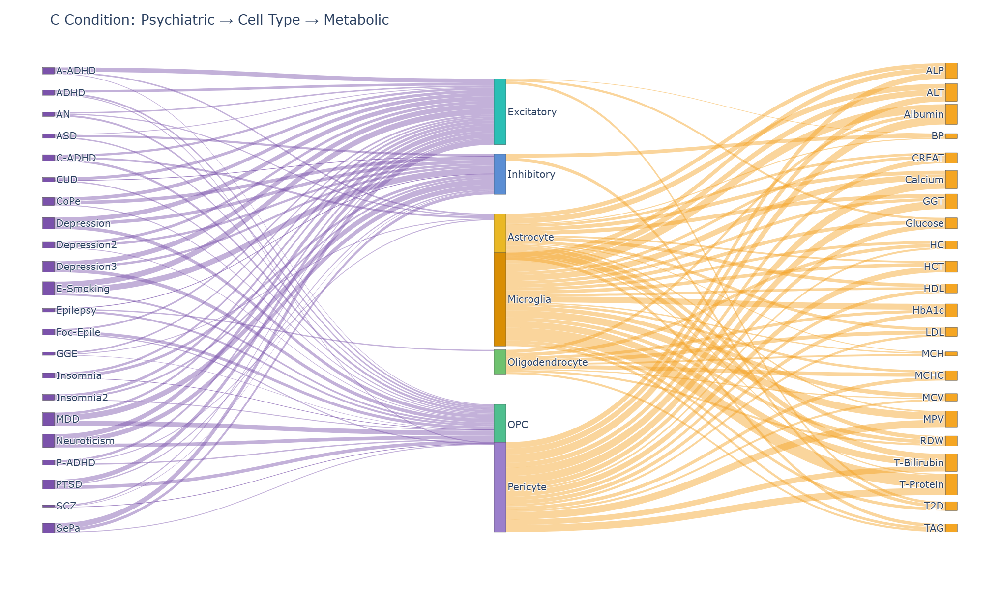

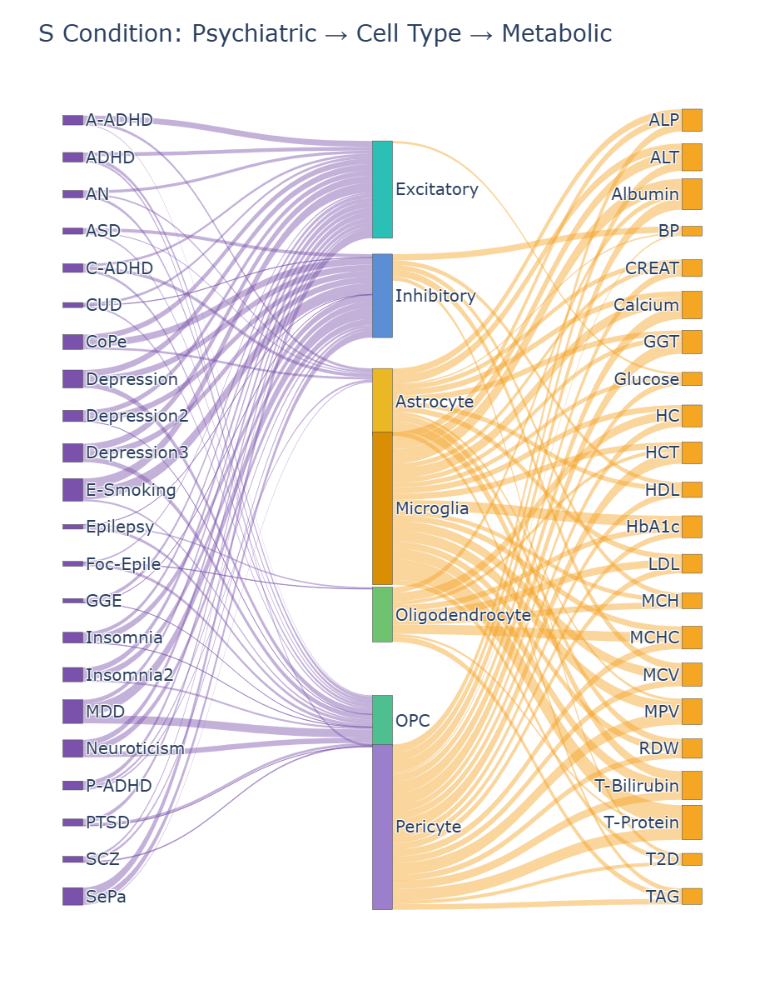

✓ Finished.


In [3]:
import os
import pandas as pd
import plotly.graph_objects as go

# ==========================================================
# 1. PATHS
# ==========================================================

data_dir = "/biostack/home/suchenyi/graduate/scdrs/downstream_hg38"

gc_file = "/biostack/home/suchenyi/graduate/scdrs/lambda_GC_all.tsv"

# ==========================================================
# 2. TRAITS
# ==========================================================

traits = [

    f.replace(".scdrs_group.con_ct","")

    for f in os.listdir(data_dir)

    if f.endswith(".scdrs_group.con_ct")
]

print("All traits:",len(traits))

# ==========================================================
# 3. λGC FILTER
# ==========================================================

df_gc = pd.read_csv(gc_file,sep="\t")

valid_traits = df_gc.loc[
    df_gc["Lambda_GC"]<=2,
    "Trait"
].astype(str).tolist()

traits = [t for t in traits if t in valid_traits]

print("After λGC filter:",len(traits))

# ==========================================================
# 4. TRAIT CATEGORY
# ==========================================================

PSYCHIATRIC_TRAITS = [
"SCZ","mdd","MDD","Depression","Depression2","Depression3",
"ADHD","A-ADHD","C-ADHD","P-ADHD",
"ASD","Neuroticism","PTSD",
"Insomnia","Insomnia2",
"Epilepsy","Foc-Epile","GGE",
"AN","CUD","E-Smoking",
"CoPe","SePa"
]

METABOLIC_TRAITS = [
"BMI","BMI2","T2D","Glucose","HbA1c",
"HDL","LDL","TAG","BP",
"Albumin","CREAT","ALP","ALT","GGT",
"Calcium","HC","MCH","MCHC",
"MCV","MPV","RDW","HCT",
"T-Bilirubin","T-Protein"
]

psy_traits = [t for t in traits if t in PSYCHIATRIC_TRAITS]
met_traits = [t for t in traits if t in METABOLIC_TRAITS]

# ==========================================================
# 5. CELLTYPE MAP
# ==========================================================

CELLTYPE_CLASS_MAP = {

"L2-3":"Excitatory",
"L2-4":"Excitatory",
"L3-5":"Excitatory",
"L5":"Excitatory",
"L5-6":"Excitatory",
"L6":"Excitatory",

"InN":"Inhibitory",

"Astro":"Astrocyte",
"Micro":"Microglia",
"Oligo":"Oligodendrocyte",
"OPC":"OPC",
"PC":"Pericyte",
}

def map_celltype(ct):

    for k,v in CELLTYPE_CLASS_MAP.items():

        if ct.startswith(k):

            return v

    return "Other"

# ==========================================================
# 6. LOAD con_ct
# ==========================================================

all_df=[]

keep_traits = psy_traits + met_traits

for trait in keep_traits:

    fp = os.path.join(
        data_dir,
        f"{trait}.scdrs_group.con_ct"
    )

    if not os.path.exists(fp):
        continue

    tmp = pd.read_csv(fp,sep="\t")

    tmp["trait"] = trait

    # split C&Astro

    tmp[["condition","cell_type"]] = (
        tmp["group"]
        .str.split("&",expand=True)
    )

    tmp["zscore"] = tmp["assoc_mcz"]

    all_df.append(
        tmp[
            ["trait",
             "condition",
             "cell_type",
             "zscore"]
        ]
    )

df = pd.concat(all_df)

# ==========================================================
# 7. MAP CELL CLASS
# ==========================================================

df["cell_class"] = df["cell_type"].apply(
    map_celltype
)

df = df[
    df["cell_class"]!="Other"
]

# ==========================================================
# 8. DRAW FUNCTION
# ==========================================================

def draw_sankey(condition):

    sub = df[
        df["condition"]==condition
    ].copy()

    agg = (

        sub
        .groupby(
            ["trait","cell_class"]
        )["zscore"]
        .mean()
        .reset_index()

    )

    # Top3

    agg = (

        agg
        .sort_values(
            "zscore",
            ascending=False
        )
        .groupby("trait")
        .head(3)

    )

    cell_order = [

        "Excitatory",
        "Inhibitory",
        "Astrocyte",
        "Microglia",
        "Oligodendrocyte",
        "OPC",
        "Pericyte"

    ]

    left_nodes = sorted(psy_traits)

    mid_nodes = cell_order

    right_nodes = sorted(met_traits)

    nodes = (
        left_nodes
        + mid_nodes
        + right_nodes
    )

    node_id = {
        n:i
        for i,n in enumerate(nodes)
    }

    sources=[]
    targets=[]
    values=[]
    colors=[]

    # Left→Middle

    psy_df = agg[
        agg["trait"].isin(
            psy_traits
        )
    ]

    for _,row in psy_df.iterrows():

        sources.append(
            node_id[row["trait"]]
        )

        targets.append(
            node_id[row["cell_class"]]
        )

        values.append(
            abs(row["zscore"])
        )

        colors.append(
            "rgba(123,82,171,0.45)"
        )

    # Middle→Right

    met_df = agg[
        agg["trait"].isin(
            met_traits
        )
    ]

    for _,row in met_df.iterrows():

        sources.append(
            node_id[row["cell_class"]]
        )

        targets.append(
            node_id[row["trait"]]
        )

        values.append(
            abs(row["zscore"])
        )

        colors.append(
            "rgba(245,162,35,0.45)"
        )

    # node colors

    cmap = {

    "Excitatory":"#2BBFB5",
    "Inhibitory":"#5B8ED4",
    "Astrocyte":"#EAB825",
    "Microglia":"#D98E04",
    "Oligodendrocyte":"#6FC26F",
    "OPC":"#4FBF8F",
    "Pericyte":"#9B7FCC"

    }

    node_colors=[]

    for n in nodes:

        if n in left_nodes:

            node_colors.append(
                "#7B52AB"
            )

        elif n in right_nodes:

            node_colors.append(
                "#F5A623"
            )

        else:

            node_colors.append(
                cmap[n]
            )

    # coordinates

    def even_y(n):

        return [
            (i+1)/(n+1)
            for i in range(n)
        ]

    y_left=even_y(len(left_nodes))
    y_mid=even_y(len(mid_nodes))
    y_right=even_y(len(right_nodes))

    y_map={}

    for n,y in zip(left_nodes,y_left):
        y_map[n]=y

    for n,y in zip(mid_nodes,y_mid):
        y_map[n]=y

    for n,y in zip(right_nodes,y_right):
        y_map[n]=y

    x_pos=[]
    y_pos=[]

    for n in nodes:

        if n in left_nodes:

            x_pos.append(0.01)

        elif n in mid_nodes:

            x_pos.append(0.50)

        else:

            x_pos.append(0.99)

        y_pos.append(
            y_map[n]
        )

    fig = go.Figure(

        go.Sankey(

            arrangement="fixed",

            node=dict(

                pad=18,

                thickness=24,

                label=nodes,

                color=node_colors,

                x=x_pos,

                y=y_pos

            ),

            link=dict(

                source=sources,

                target=targets,

                value=values,

                color=colors

            )

        )

    )

    fig.update_layout(

        title=f"{condition} Condition: Psychiatric → Cell Type → Metabolic",

        width=1800,

        height=1200,

        font=dict(size=20),

        paper_bgcolor="white"

    )

    fig.write_html(
        f"Sankey_{condition}.html"
    )

    fig.show()

# ==========================================================
# 9. DRAW BOTH
# ==========================================================

draw_sankey("C")

draw_sankey("S")

print("✓ Finished.")

In [11]:
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.stats import fisher_exact
from pathlib import Path

# ================================
# 参数
# ================================
REGIONS = ["BA12", "BA46"]
CONDS = ["C", "S"]
REPS = [1, 2]

TRAITS = [
    "SCZ", "MDD", "Neuroticism", "E-Smoking",
    "IQ", "CoPe", "Depression", "Depression2",
    "Depression3", "SePa", "Insomnia"
]

CELLTYPES = ["Glut", "Gaba", "NN"]

BASE_DIR = Path("/biostack/home/suchenyi/graduate/gsmap/human_h5ad")

# ================================
# OR计算函数
# ================================
def compute_or_single_trait(adata, score_df, celltype):

    # --------------------------------
    # 细胞大类划分
    # --------------------------------
    labels = (
        adata.obs["manual_cell_type_reannotated"]
        .astype(str)
        .str.strip()
    )

    if celltype == "Glut":

        mask = labels.str.startswith("L")

    elif celltype == "Gaba":

        mask = labels.str.startswith("InN")

    elif celltype == "NN":

        mask = ~(
            labels.str.startswith("L")
            | labels.str.startswith("InN")
        )

    else:
        return None

    cells = adata.obs[mask].index

    if len(cells) == 0:
        return None

    # --------------------------------
    # subset
    # --------------------------------
    adata_sub = adata[cells].copy()

    # 取 z-score
    scores = score_df.loc[cells, "z"].values

    # 去掉 nan
    valid_mask = ~np.isnan(scores)

    scores = scores[valid_mask]

    adata_sub = adata_sub[valid_mask].copy()

    if len(scores) == 0:
        return None

    # --------------------------------
    # top5% enrichment
    # --------------------------------
    threshold = np.quantile(scores, 0.95)

    sig_mask = scores >= threshold

    adata_sub.obs["sig"] = sig_mask.astype(int)

    # =====================================
    # 空间区域定义
    # =====================================
    coords = adata_sub.obsm["spatial"]

    x_min, x_max = coords[:, 0].min(), coords[:, 0].max()
    y_min, y_max = coords[:, 1].min(), coords[:, 1].max()

    x_span = x_max - x_min
    y_span = y_max - y_min

    target_x_span = x_span * 0.4
    target_y_span = y_span * 0.5

    target_x_center = (x_max + x_min) / 2
    target_y_center = y_min + y_span * 0.76

    x_min_target = target_x_center - target_x_span / 2
    x_max_target = target_x_center + target_x_span / 2

    y_min_target = target_y_center - target_y_span / 2
    y_max_target = target_y_center + target_y_span / 2

    in_target = (
        (coords[:, 0] >= x_min_target)
        & (coords[:, 0] <= x_max_target)
        & (coords[:, 1] >= y_min_target)
        & (coords[:, 1] <= y_max_target)
    )

    adata_sub.obs["in_target"] = in_target

    # =====================================
    # 四格表
    # =====================================
    target_cells = adata_sub.obs[adata_sub.obs["in_target"]]
    other_cells = adata_sub.obs[~adata_sub.obs["in_target"]]

    a = (target_cells["sig"] == 1).sum()
    c = (target_cells["sig"] == 0).sum()

    b = (other_cells["sig"] == 1).sum()
    d = (other_cells["sig"] == 0).sum()

    # =====================================
    # Fisher exact test
    # =====================================
    if (a == 0 and b == 0) or (c == 0 and d == 0):

        OR = np.nan
        pval = 1.0

    else:

        OR, pval = fisher_exact([[a, b], [c, d]])

    return a, b, c, d, OR, pval


# ================================
# 主循环
# ================================
all_results = []

for region in REGIONS:

    for cond in CONDS:

        rep_results = []

        for rep in REPS:

            print(f"\nProcessing {region}_{cond}_rep{rep}")

            base = BASE_DIR / f"{region}_{cond}_rep{rep}"

            # --------------------------------
            # h5ad
            # --------------------------------
            adata_file = (
                base /
                f"{region}_{cond}_rep{rep}_annotated.h5ad"
            )

            adata = sc.read_h5ad(adata_file)

            # 强制统一 index 类型
            adata.obs_names = adata.obs_names.astype(str)

            spatial_dir = base / "spatial_ldsc"

            rep_rows = []

            # =====================================
            # 遍历 traits
            # =====================================
            for trait in TRAITS:

                print(f"  Trait: {trait}")

                score_file = (
                    spatial_dir /
                    f"{region}_{cond}_rep{rep}_{trait}.csv.gz"
                )

                if not score_file.exists():

                    print(f"    Missing: {score_file.name}")
                    continue

                # --------------------------------
                # read score
                # --------------------------------
                score_df = pd.read_csv(
                    score_file,
                    index_col=0
                )

                # 强制统一 index 类型
                score_df.index = score_df.index.astype(str)

                # --------------------------------
                # 共同cells
                # --------------------------------
                common_cells = (
                    score_df.index
                    .intersection(adata.obs_names)
                )

                print(f"    Common cells: {len(common_cells)}")

                if len(common_cells) == 0:
                    continue

                score_df = score_df.loc[common_cells]

                adata_sub = adata[common_cells].copy()

                # =====================================
                # 遍历 celltypes
                # =====================================
                for celltype in CELLTYPES:

                    res = compute_or_single_trait(
                        adata_sub,
                        score_df,
                        celltype
                    )

                    if res is None:

                        print(f"    Skip {celltype}")
                        continue

                    a, b, c, d, OR, pval = res

                    rep_rows.append([
                        region,
                        cond,
                        rep,
                        trait,
                        celltype,
                        a,
                        b,
                        c,
                        d,
                        OR,
                        pval
                    ])

            # =====================================
            # rep dataframe
            # =====================================
            rep_df = pd.DataFrame(
                rep_rows,
                columns=[
                    "region",
                    "condition",
                    "rep",
                    "trait",
                    "celltype",
                    "a",
                    "b",
                    "c",
                    "d",
                    "OR",
                    "pval"
                ]
            )

            rep_results.append(rep_df)

        # =====================================
        # 合并rep1/rep2
        # =====================================
        merged = pd.concat(
            rep_results,
            ignore_index=True
        )

        merged_group = (
            merged
            .groupby(
                [
                    "region",
                    "condition",
                    "trait",
                    "celltype"
                ]
            )
            .agg({
                "a": "sum",
                "b": "sum",
                "c": "sum",
                "d": "sum",
                "OR": "mean",
                "pval": "min"
            })
            .reset_index()
        )

        all_results.append(merged_group)

# ================================
# 最终输出
# ================================
final_df = pd.concat(
    all_results,
    ignore_index=True
)

final_df.to_csv(
    "human_OR_trait_results.csv",
    index=False
)

print("\n完成！")
print(final_df.head())


Processing BA12_C_rep1
  Trait: SCZ
    Common cells: 124979
  Trait: MDD
    Common cells: 124979
  Trait: Neuroticism
    Common cells: 124979
  Trait: E-Smoking
    Common cells: 124979
  Trait: IQ
    Common cells: 124979
  Trait: CoPe
    Common cells: 124979
  Trait: Depression
    Common cells: 124979
  Trait: Depression2
    Common cells: 124979
  Trait: Depression3
    Common cells: 124979
  Trait: SePa
    Common cells: 124979
  Trait: Insomnia
    Common cells: 124979

Processing BA12_C_rep2
  Trait: SCZ
    Common cells: 141892
  Trait: MDD
    Common cells: 141892
  Trait: Neuroticism
    Common cells: 141892
  Trait: E-Smoking
    Common cells: 141892
  Trait: IQ
    Common cells: 141892
  Trait: CoPe
    Common cells: 141892
  Trait: Depression
    Common cells: 141892
  Trait: Depression2
    Common cells: 141892
  Trait: Depression3
    Common cells: 141892
  Trait: SePa
    Common cells: 141892
  Trait: Insomnia
    Common cells: 141892

Processing BA12_S_rep1
  Trai

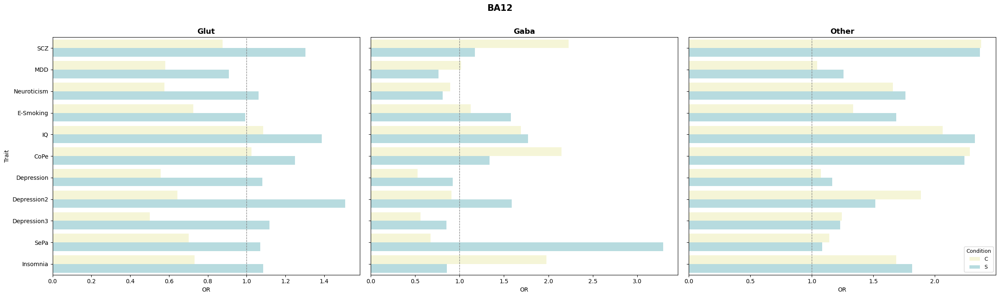

Saved: BA12_Glut_Gaba_Other_OR_traits.png


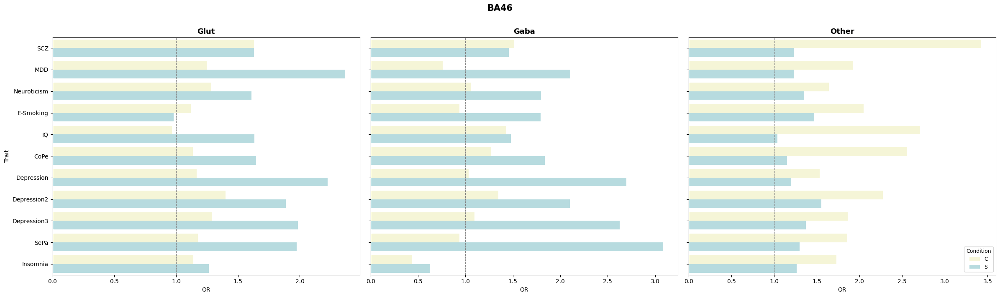

Saved: BA46_Glut_Gaba_Other_OR_traits.png


In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ======================
# 读数据
# ======================
df = pd.read_csv("OR/human_OR_trait_results.csv")
trait_order = [
    "SCZ", "MDD", "Neuroticism", "E-Smoking",
    "IQ", "CoPe", "Depression", "Depression2",
    "Depression3", "SePa", "Insomnia"
]
df["trait"] = pd.Categorical(df["trait"], categories=trait_order, ordered=True)

# ======================
# 配色
# ======================
cond_colors = {"C": "lightgoldenrodyellow", "S": "powderblue"}
celltypes = ["Glut", "Gaba", "NN"]
celltype_labels = {"Glut": "Glut", "Gaba": "Gaba", "NN": "Other"}

# ======================
# 每个region出一张三列并排图
# ======================
for region in ["BA12", "BA46"]:
    fig, axes = plt.subplots(
        nrows=1, ncols=3,
        figsize=(24, 7),
        sharey=True                      # 共享Y轴，trait标签只出现在最左列
    )

    for col_idx, celltype in enumerate(celltypes):
        ax = axes[col_idx]
        sub = df[(df["celltype"] == celltype) & (df["region"] == region)]

        sns.barplot(
            data=sub,
            y="trait",
            x="OR",
            hue="condition",
            palette=cond_colors,
            ax=ax
        )

        # OR=1 参考线
        ax.axvline(1, linestyle="--", color="gray", linewidth=0.9)


        ax.set_title(celltype_labels[celltype], fontsize=13, fontweight="bold")
        ax.set_xlabel("OR", fontsize=10)

        # 只有最左列保留 y 轴标签
        if col_idx == 0:
            ax.set_ylabel("Trait", fontsize=10)
        else:
            ax.set_ylabel("")

        # 只在最右列保留图例，其余隐藏
        if col_idx < 2:
            ax.get_legend().remove()
        else:
            ax.legend(title="Condition", fontsize=9, title_fontsize=9)

    fig.suptitle(region, fontsize=15, fontweight="bold", y=1.01)
    plt.tight_layout()
    plt.savefig(f"{region}_Glut_Gaba_Other_OR_traits.png", dpi=300, bbox_inches="tight")
    plt.show()
    print(f"Saved: {region}_Glut_Gaba_Other_OR_traits.png")

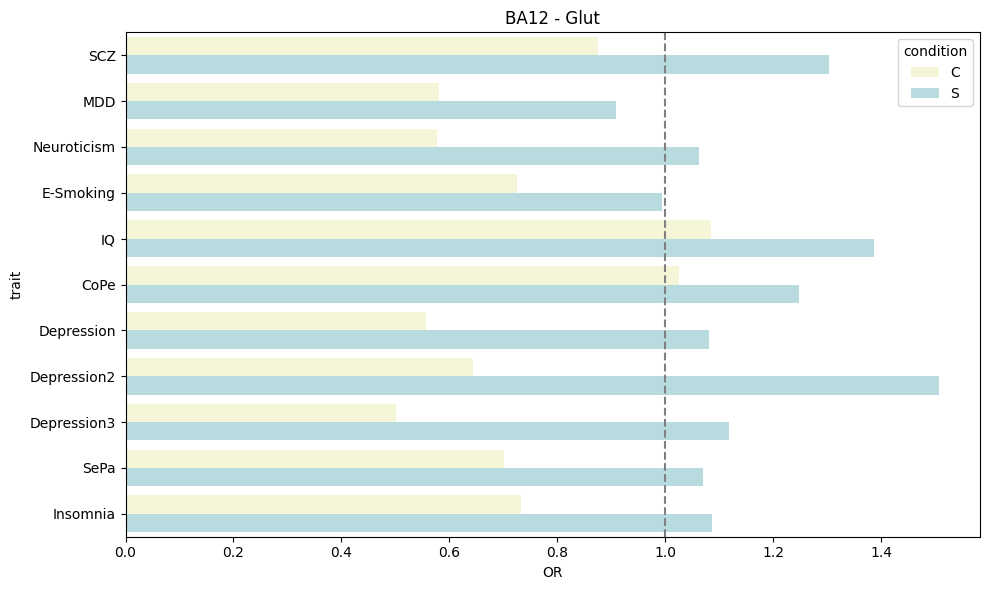

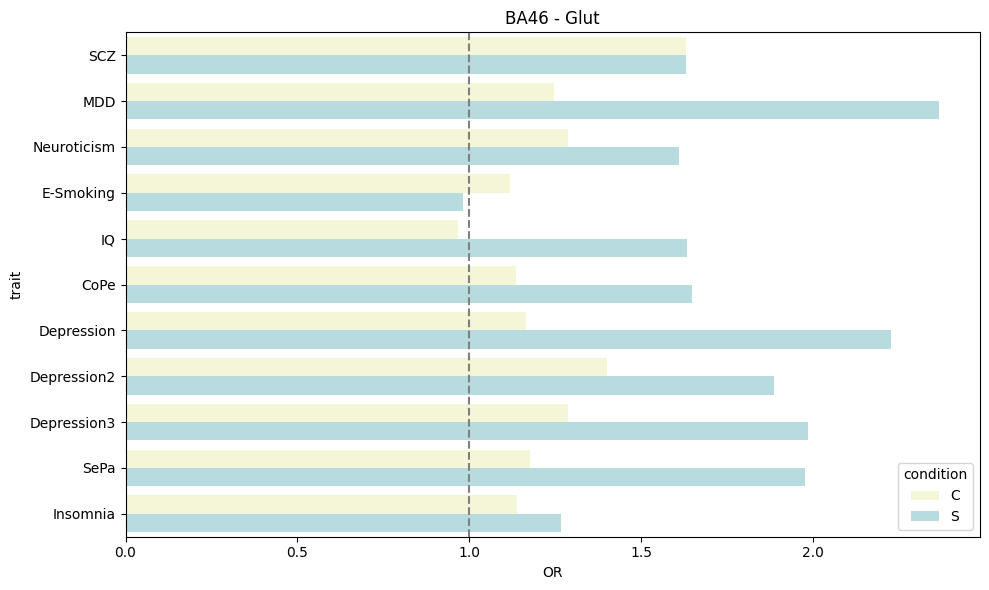

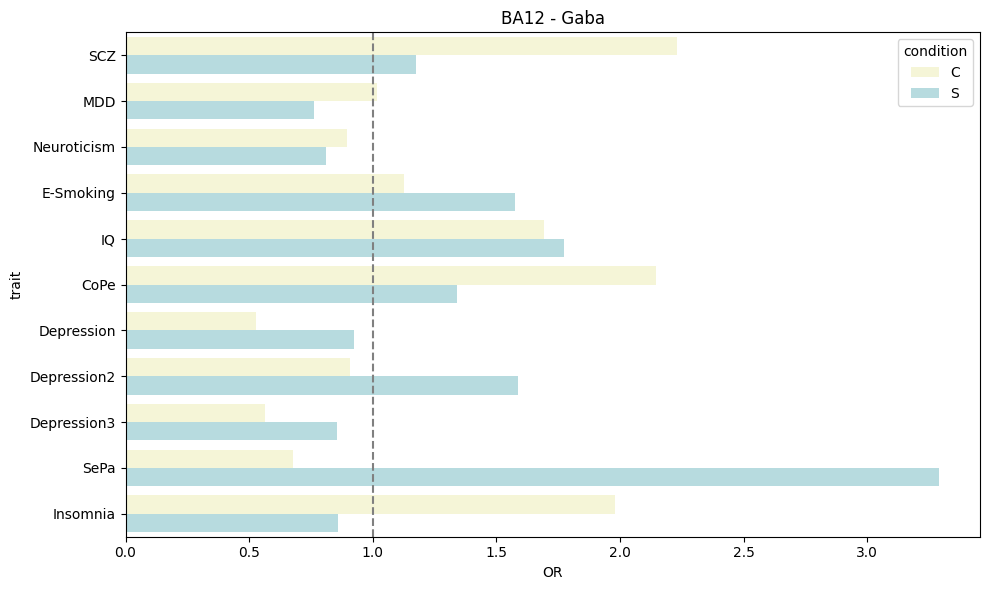

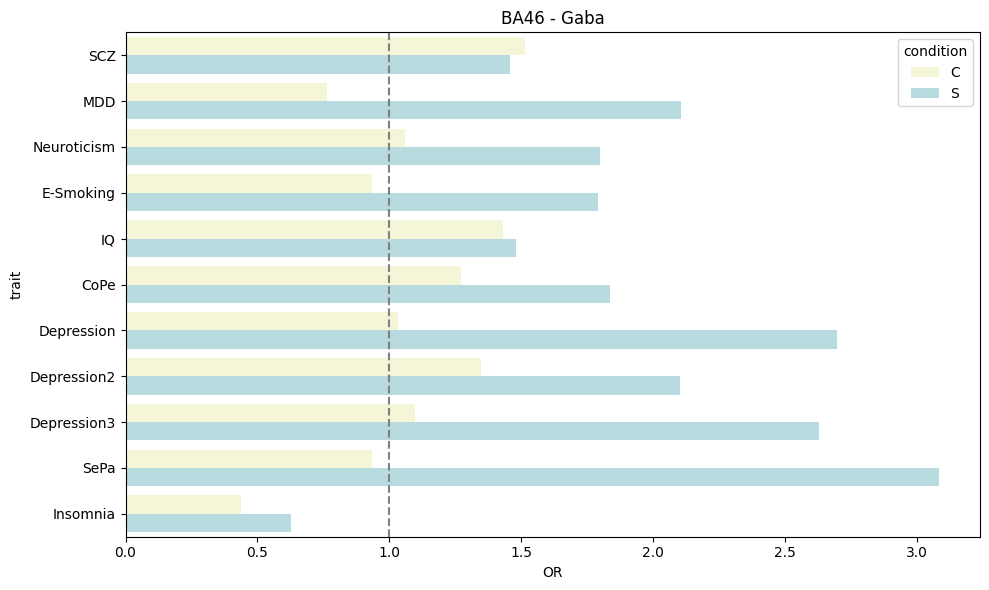

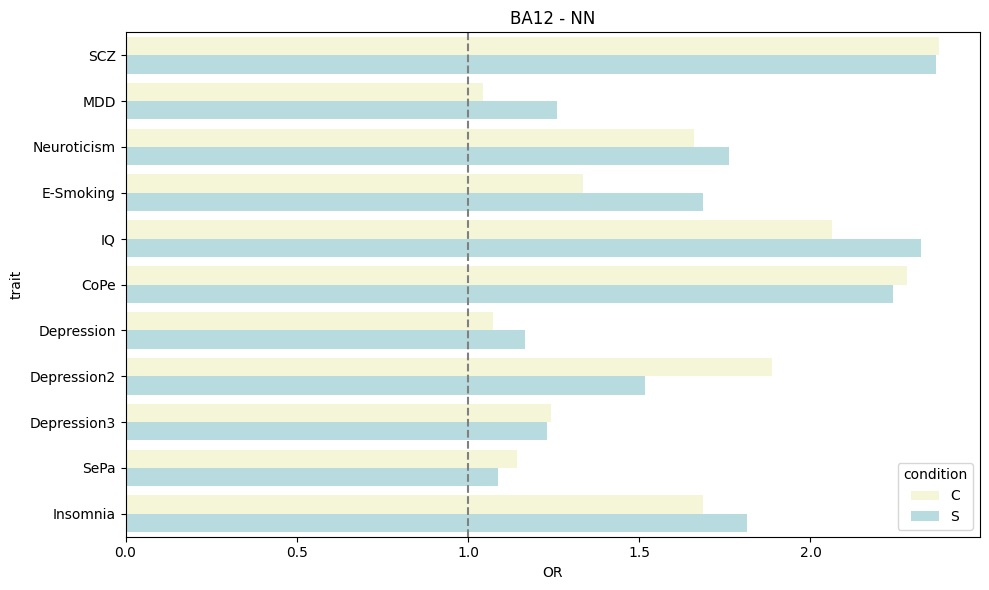

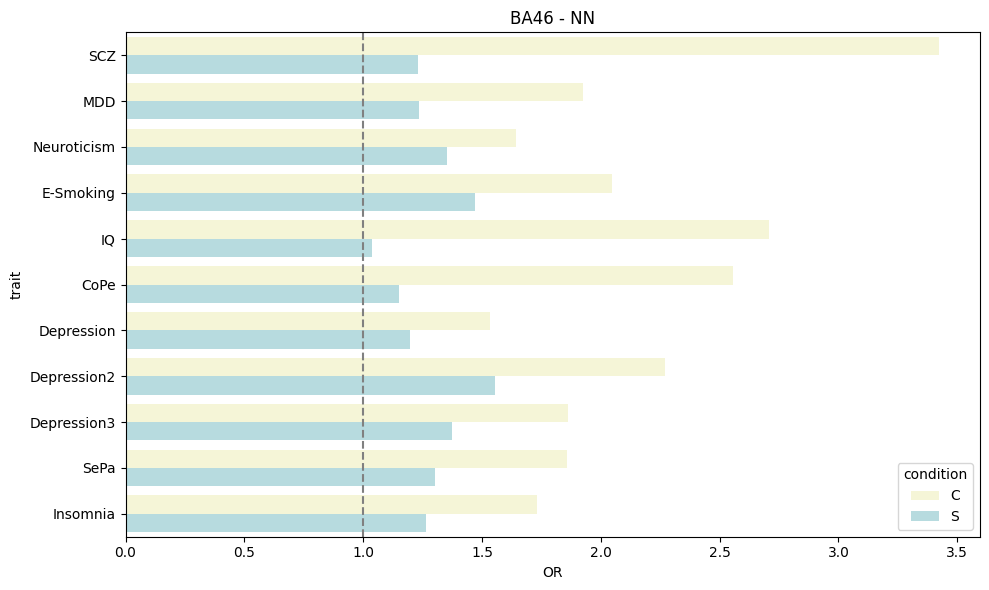

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ======================
# 读数据
# ======================
df = pd.read_csv("human_OR_trait_results.csv")

trait_order = [
    "SCZ", "MDD", "Neuroticism", "E-Smoking",
    "IQ", "CoPe", "Depression", "Depression2",
    "Depression3", "SePa", "Insomnia"
]

df["trait"] = pd.Categorical(
    df["trait"],
    categories=trait_order,
    ordered=True
)

# ======================
# 配色
# ======================
cond_colors = {
    "C": "lightgoldenrodyellow",
    "S": "powderblue"
}

# ======================
# 分celltype画图
# ======================
for celltype in ["Glut", "Gaba", "NN"]:

    for region in ["BA12", "BA46"]:

        sub = df[
            (df["celltype"] == celltype)
            & (df["region"] == region)
        ]

        plt.figure(figsize=(10, 6))

        ax = sns.barplot(
            data=sub,
            y="trait",
            x="OR",
            hue="condition",
            palette=cond_colors
        )

        # OR=1参考线
        ax.axvline(
            1,
            linestyle="--",
            color="gray"
        )

        # p值标注
#        for i, row in sub.iterrows():
#
#            ax.text(
#                row["OR"] + 0.03,
#                trait_order.index(row["trait"]),
#                f'p={row["pval"]:.1e}',
#                fontsize=7
#            )

        plt.title(f"{region} - {celltype}")

        plt.tight_layout()

        plt.savefig(
            f"{region}_{celltype}_OR_traits.pdf",
            dpi=300
        )

        plt.show()

In [22]:
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.stats import fisher_exact
from pathlib import Path

# ================================
# 参数
# ================================
REGIONS = ["BA12", "BA46"]
CONDS = ["C", "S"]
REPS = [1, 2]

TRAITS = [
    "SCZ", "MDD", "Neuroticism", "E-Smoking",
    "IQ", "CoPe", "Depression", "Depression2",
    "Depression3", "SePa", "Insomnia"
]

CELLTYPES = ["InN SST","InN VIP","InN PVALB"]

BASE_DIR = Path("/biostack/home/suchenyi/graduate/gsmap/human_h5ad")

# ================================
# OR计算函数
# ================================
def compute_or_single_trait(adata, score_df, celltype):

    # --------------------------------
    # 细胞大类划分
    # --------------------------------
    labels = (
        adata.obs["manual_cell_type_reannotated"]
        .astype(str)
        .str.strip()
    )

    if celltype == "InN SST":

        mask = labels.str.startswith("InN SST")

    elif celltype == "InN VIP":

        mask = labels.str.startswith("InN VIP")

    elif celltype == "InN PVALB":

        mask =labels.str.startswith("InN PVALB")

    else:
        return None

    cells = adata.obs[mask].index

    if len(cells) == 0:
        return None

    # --------------------------------
    # subset
    # --------------------------------
    adata_sub = adata[cells].copy()

    # 取 z-score
    scores = score_df.loc[cells, "z"].values

    # 去掉 nan
    valid_mask = ~np.isnan(scores)

    scores = scores[valid_mask]

    adata_sub = adata_sub[valid_mask].copy()

    if len(scores) == 0:
        return None

    # --------------------------------
    # top5% enrichment
    # --------------------------------
    threshold = np.quantile(scores, 0.95)

    sig_mask = scores >= threshold

    adata_sub.obs["sig"] = sig_mask.astype(int)

    # =====================================
    # 空间区域定义
    # =====================================
    coords = adata_sub.obsm["spatial"]

    x_min, x_max = coords[:, 0].min(), coords[:, 0].max()
    y_min, y_max = coords[:, 1].min(), coords[:, 1].max()

    x_span = x_max - x_min
    y_span = y_max - y_min

    target_x_span = x_span * 0.4
    target_y_span = y_span * 0.5

    target_x_center = (x_max + x_min) / 2
    target_y_center = y_min + y_span * 0.76

    x_min_target = target_x_center - target_x_span / 2
    x_max_target = target_x_center + target_x_span / 2

    y_min_target = target_y_center - target_y_span / 2
    y_max_target = target_y_center + target_y_span / 2

    in_target = (
        (coords[:, 0] >= x_min_target)
        & (coords[:, 0] <= x_max_target)
        & (coords[:, 1] >= y_min_target)
        & (coords[:, 1] <= y_max_target)
    )

    adata_sub.obs["in_target"] = in_target

    # =====================================
    # 四格表
    # =====================================
    target_cells = adata_sub.obs[adata_sub.obs["in_target"]]
    other_cells = adata_sub.obs[~adata_sub.obs["in_target"]]

    a = (target_cells["sig"] == 1).sum()
    c = (target_cells["sig"] == 0).sum()

    b = (other_cells["sig"] == 1).sum()
    d = (other_cells["sig"] == 0).sum()

    # =====================================
    # Fisher exact test
    # =====================================
    if (a == 0 and b == 0) or (c == 0 and d == 0):

        OR = np.nan
        pval = 1.0

    else:

        OR, pval = fisher_exact([[a, b], [c, d]])

    return a, b, c, d, OR, pval


# ================================
# 主循环
# ================================
all_results = []

for region in REGIONS:

    for cond in CONDS:

        rep_results = []

        for rep in REPS:

            print(f"\nProcessing {region}_{cond}_rep{rep}")

            base = BASE_DIR / f"{region}_{cond}_rep{rep}"

            # --------------------------------
            # h5ad
            # --------------------------------
            adata_file = (
                base /
                f"{region}_{cond}_rep{rep}_annotated.h5ad"
            )

            adata = sc.read_h5ad(adata_file)

            # 强制统一 index 类型
            adata.obs_names = adata.obs_names.astype(str)

            spatial_dir = base / "spatial_ldsc"

            rep_rows = []

            # =====================================
            # 遍历 traits
            # =====================================
            for trait in TRAITS:

                print(f"  Trait: {trait}")

                score_file = (
                    spatial_dir /
                    f"{region}_{cond}_rep{rep}_{trait}.csv.gz"
                )

                if not score_file.exists():

                    print(f"    Missing: {score_file.name}")
                    continue

                # --------------------------------
                # read score
                # --------------------------------
                score_df = pd.read_csv(
                    score_file,
                    index_col=0
                )

                # 强制统一 index 类型
                score_df.index = score_df.index.astype(str)

                # --------------------------------
                # 共同cells
                # --------------------------------
                common_cells = (
                    score_df.index
                    .intersection(adata.obs_names)
                )

                print(f"    Common cells: {len(common_cells)}")

                if len(common_cells) == 0:
                    continue

                score_df = score_df.loc[common_cells]

                adata_sub = adata[common_cells].copy()

                # =====================================
                # 遍历 celltypes
                # =====================================
                for celltype in CELLTYPES:

                    res = compute_or_single_trait(
                        adata_sub,
                        score_df,
                        celltype
                    )

                    if res is None:

                        print(f"    Skip {celltype}")
                        continue

                    a, b, c, d, OR, pval = res

                    rep_rows.append([
                        region,
                        cond,
                        rep,
                        trait,
                        celltype,
                        a,
                        b,
                        c,
                        d,
                        OR,
                        pval
                    ])

            # =====================================
            # rep dataframe
            # =====================================
            rep_df = pd.DataFrame(
                rep_rows,
                columns=[
                    "region",
                    "condition",
                    "rep",
                    "trait",
                    "celltype",
                    "a",
                    "b",
                    "c",
                    "d",
                    "OR",
                    "pval"
                ]
            )

            rep_results.append(rep_df)

        # =====================================
        # 合并rep1/rep2
        # =====================================
        merged = pd.concat(
            rep_results,
            ignore_index=True
        )

        merged_group = (
            merged
            .groupby(
                [
                    "region",
                    "condition",
                    "trait",
                    "celltype"
                ]
            )
            .agg({
                "a": "sum",
                "b": "sum",
                "c": "sum",
                "d": "sum",
                "OR": "mean",
                "pval": "min"
            })
            .reset_index()
        )

        all_results.append(merged_group)

# ================================
# 最终输出
# ================================
final_df = pd.concat(
    all_results,
    ignore_index=True
)

final_df.to_csv(
    "human_OR_trait_results_InN.csv",
    index=False
)

print("\n完成！")
print(final_df.head())


Processing BA12_C_rep1
  Trait: SCZ
    Common cells: 124979
  Trait: MDD
    Common cells: 124979
  Trait: Neuroticism
    Common cells: 124979
  Trait: E-Smoking
    Common cells: 124979
  Trait: IQ
    Common cells: 124979
  Trait: CoPe
    Common cells: 124979
  Trait: Depression
    Common cells: 124979
  Trait: Depression2
    Common cells: 124979
  Trait: Depression3
    Common cells: 124979
  Trait: SePa
    Common cells: 124979
  Trait: Insomnia
    Common cells: 124979

Processing BA12_C_rep2
  Trait: SCZ
    Common cells: 141892
  Trait: MDD
    Common cells: 141892
  Trait: Neuroticism
    Common cells: 141892
  Trait: E-Smoking
    Common cells: 141892
  Trait: IQ
    Common cells: 141892
  Trait: CoPe
    Common cells: 141892
  Trait: Depression
    Common cells: 141892
  Trait: Depression2
    Common cells: 141892
  Trait: Depression3
    Common cells: 141892
  Trait: SePa
    Common cells: 141892
  Trait: Insomnia
    Common cells: 141892

Processing BA12_S_rep1
  Trai

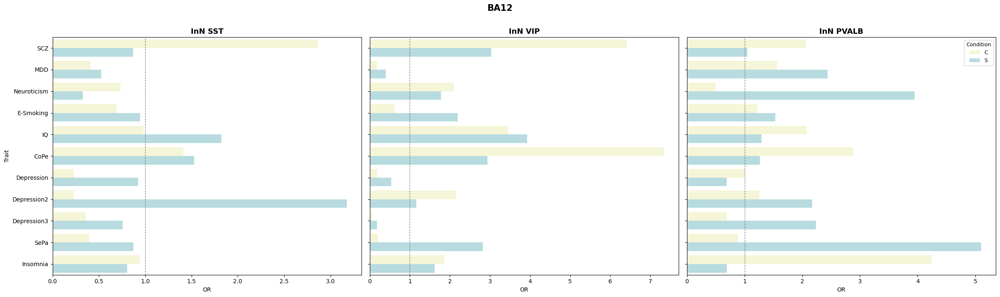

Saved: BA12_InN_OR_traits.png


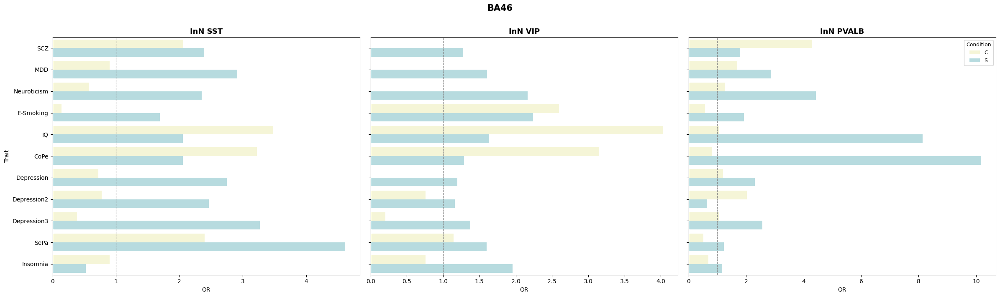

Saved: BA46_InN_OR_traits.png


In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ======================
# 读数据
# ======================
df = pd.read_csv("OR/human_OR_trait_results_InN.csv")
trait_order = [
    "SCZ", "MDD", "Neuroticism", "E-Smoking",
    "IQ", "CoPe", "Depression", "Depression2",
    "Depression3", "SePa", "Insomnia"
]
df["trait"] = pd.Categorical(df["trait"], categories=trait_order, ordered=True)

# ======================
# 配色
# ======================
cond_colors = {"C": "lightgoldenrodyellow", "S": "powderblue"}
celltypes = ["InN SST", "InN VIP", "InN PVALB"]
celltype_labels = {"InN SST": "InN SST", "InN VIP": "InN VIP", "InN PVALB": "InN PVALB"}

# ======================
# 每个region出一张三列并排图
# ======================
for region in ["BA12", "BA46"]:
    fig, axes = plt.subplots(
        nrows=1, ncols=3,
        figsize=(24, 7),
        sharey=True                      # 共享Y轴，trait标签只出现在最左列
    )

    for col_idx, celltype in enumerate(celltypes):
        ax = axes[col_idx]
        sub = df[(df["celltype"] == celltype) & (df["region"] == region)]

        sns.barplot(
            data=sub,
            y="trait",
            x="OR",
            hue="condition",
            palette=cond_colors,
            ax=ax
        )

        # OR=1 参考线
        ax.axvline(1, linestyle="--", color="gray", linewidth=0.9)


        ax.set_title(celltype_labels[celltype], fontsize=13, fontweight="bold")
        ax.set_xlabel("OR", fontsize=10)

        # 只有最左列保留 y 轴标签
        if col_idx == 0:
            ax.set_ylabel("Trait", fontsize=10)
        else:
            ax.set_ylabel("")

        # 只在最右列保留图例，其余隐藏
        if col_idx < 2:
            ax.get_legend().remove()
        else:
            ax.legend(title="Condition", fontsize=9, title_fontsize=9)

    fig.suptitle(region, fontsize=15, fontweight="bold", y=1.01)
    plt.tight_layout()
    plt.savefig(f"{region}_InN_OR_traits.png", dpi=300, bbox_inches="tight")
    plt.show()
    print(f"Saved: {region}_InN_OR_traits.png")